In [1]:
#Set-up block
import scanpy as sc #software suite of tools for single-cell analysis in python
import besca as bc
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import scipy
import warnings
import anndata as ad
import shap
import umap
import time
sc.set_figure_params(dpi=100)
warnings.filterwarnings('ignore')
sc.set_figure_params(scanpy=True, dpi=100)
rand_seed=10

from matplotlib_venn import venn3

/Users/dhaneshpatel/Documents/Tabula_muris_files/tabulaMuris_env/lib/python3.11/site-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
/Users/dhaneshpatel/Documents/Tabula_muris_files/tabulaMuris_env/lib/python3.11/site-packages/scvi/_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (
`set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`


In [2]:
import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras.utils import to_categorical
from tensorflow.keras import layers, models
import keras_tuner

In [3]:
sc.logging.print_header()

scanpy==1.9.6 anndata==0.10.3 umap==0.5.5 numpy==1.26.2 scipy==1.11.4 pandas==2.1.4 scikit-learn==1.1.3 statsmodels==0.14.0 igraph==0.10.8 pynndescent==0.5.11


In [4]:
#####################################
#Load datasets
#####################################

#Filename of droplet data
spleen_droplet_fileName="tabula-muris-senis-droplet-processed-official-annotations-Spleen.h5ad"         

#Load h5 data files 
spleen_matrix = sc.read_h5ad(spleen_droplet_fileName)


In [5]:
#Changing main variable name for subsequent processing
adata=spleen_matrix

In [6]:
adata

AnnData object with n_obs × n_vars = 35718 × 20138
    obs: 'age', 'cell', 'cell_ontology_class', 'cell_ontology_id', 'free_annotation', 'method', 'mouse.id', 'n_genes', 'sex', 'subtissue', 'tissue', 'tissue_free_annotation', 'n_counts', 'louvain', 'leiden'
    var: 'n_cells', 'means', 'dispersions', 'dispersions_norm', 'highly_variable'
    uns: 'age_colors', 'cell_ontology_class_colors', 'leiden', 'louvain', 'neighbors', 'pca'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

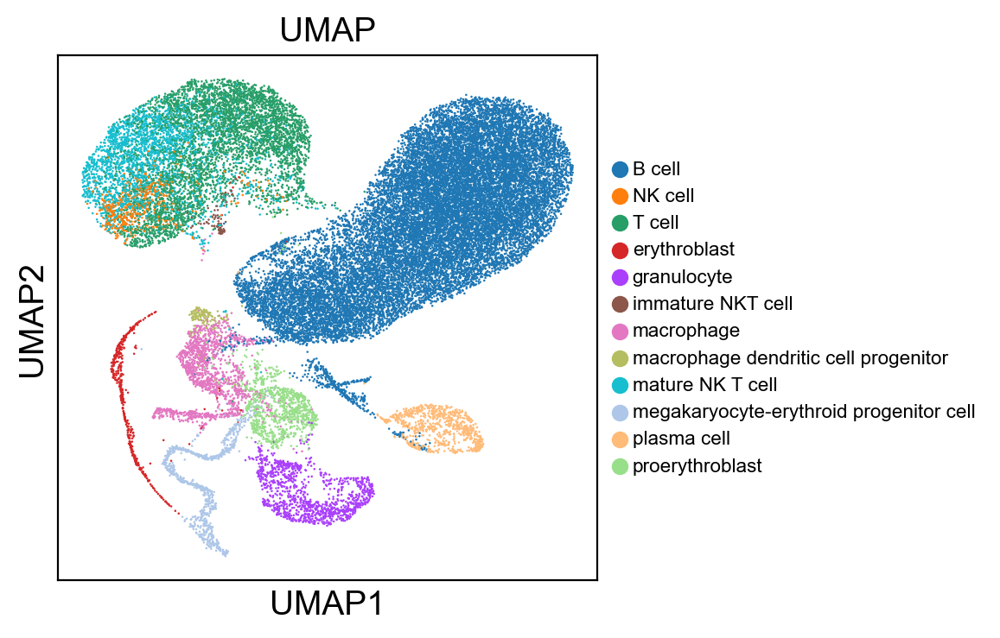

In [7]:
#Visualize UMAP based on Tabula Muris cell ontology
sc.pl.umap(adata, color=['cell_ontology_class'],title='UMAP', legend_loc='right margin', legend_fontsize='xx-small') # Plot the UMAP and color by the Leiden clusters.

In [8]:
tabula_spleen_genes=['Ccl6', 'Ccr2', 'Cd14', 'Cd19', 'Cd3e', 'Cd3g', 'Cd4', 'Cd5', 
                         'Cd74', 'Cd79a', 'Cd79b', 'Cd8a', 'Cd9', 'Cnn3', 'Flt3', 'Hmgn3', 'Ifitm3', 
                         'Il2rb', 'Itgax', 'Klrb1a', 'Klrk1', 'Lyz1', 'Mpeg1', 'Ptprc', 'Vcam1']
#sc.pl.umap(adata, color=tabula_spleen_genes) 

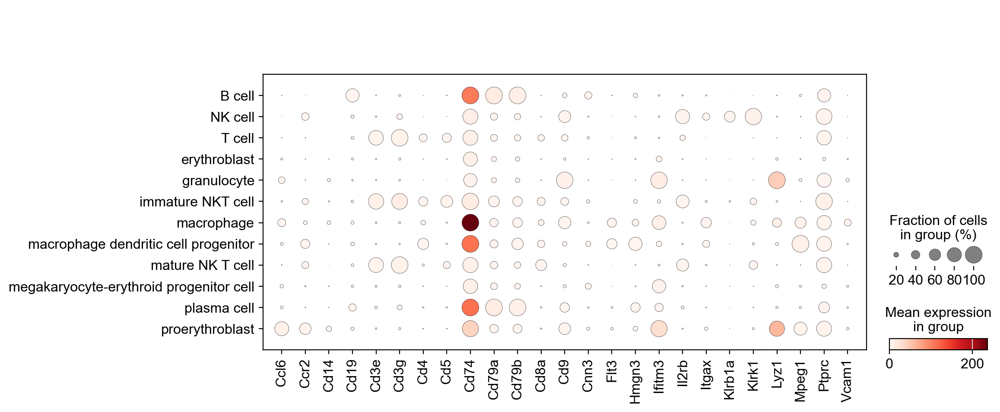

In [9]:
sc.pl.dotplot(adata, tabula_spleen_genes, groupby='cell_ontology_class') # plot droplet plots to visualize marker genes in each cluster\

In [10]:
sc.pp.filter_cells(adata, min_genes=200) #filter cells with less than 200 genes
sc.pp.filter_genes(adata, min_cells=3) #filter genes expressed in less than 3 cells

In [11]:
sc.pp.calculate_qc_metrics(adata, percent_top=None, log1p=False, inplace=True) #calculate QC metrics

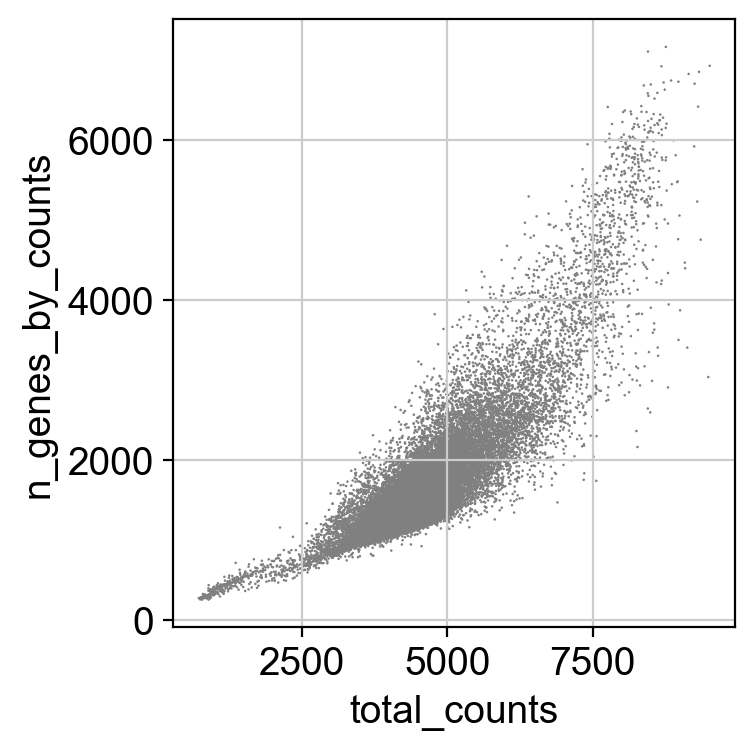

In [12]:
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts') #plot a scatter plot of total counts vs. number of genes

In [13]:
adata = adata[adata.obs.n_genes_by_counts < 4000, :] #filter out cells with more than 4000 genes
adata = adata[adata.obs.total_counts < 7500, :] #filter out cells with more than 2500 genes
adata = adata[adata.obs.n_genes_by_counts > 500, :] #filter out cells with more than 2500 genes
adata = adata[adata.obs.total_counts > 2000, :] #filter out cells with more than 2500 genes

In [14]:
adata

View of AnnData object with n_obs × n_vars = 34494 × 16205
    obs: 'age', 'cell', 'cell_ontology_class', 'cell_ontology_id', 'free_annotation', 'method', 'mouse.id', 'n_genes', 'sex', 'subtissue', 'tissue', 'tissue_free_annotation', 'n_counts', 'louvain', 'leiden', 'n_genes_by_counts', 'total_counts'
    var: 'n_cells', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'age_colors', 'cell_ontology_class_colors', 'leiden', 'louvain', 'neighbors', 'pca'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

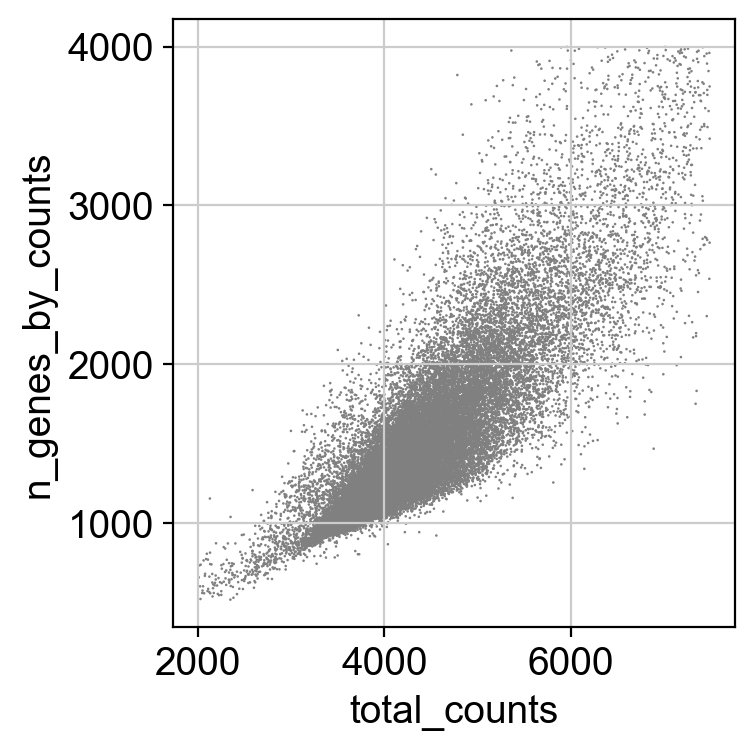

In [15]:
#View scatter plots of gene #s over total counts post filtering
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts') #plot a scatter plot of total counts vs. number of genes

In [16]:
sc.pp.normalize_total(adata, target_sum=1e4) # Total-count normalize (library-size correct) the data matrix 𝐗 to 10,000 reads per cell, so that counts become comparable among cells.

In [17]:
sc.pp.log1p(adata) #Logarithmize the data

In [18]:
#Saving a copy of 
adata_allGenes_normLog = adata

In [19]:
adata.obs['age'].value_counts()

age
30m    8318
3m     7076
21m    6319
18m    6051
24m    3780
1m     2950
Name: count, dtype: int64

In [20]:
#Taking all genes, but already looking at T cell subsetting
adata_Tcells_early = adata[adata.obs['cell_ontology_class']=='T cell']
adata_Tcells_early


View of AnnData object with n_obs × n_vars = 4705 × 16205
    obs: 'age', 'cell', 'cell_ontology_class', 'cell_ontology_id', 'free_annotation', 'method', 'mouse.id', 'n_genes', 'sex', 'subtissue', 'tissue', 'tissue_free_annotation', 'n_counts', 'louvain', 'leiden', 'n_genes_by_counts', 'total_counts'
    var: 'n_cells', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'age_colors', 'cell_ontology_class_colors', 'leiden', 'louvain', 'neighbors', 'pca', 'log1p'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [21]:
adata_Tcells_early.obs['age'].value_counts()

age
3m     1487
1m      782
21m     754
30m     750
18m     591
24m     341
Name: count, dtype: int64

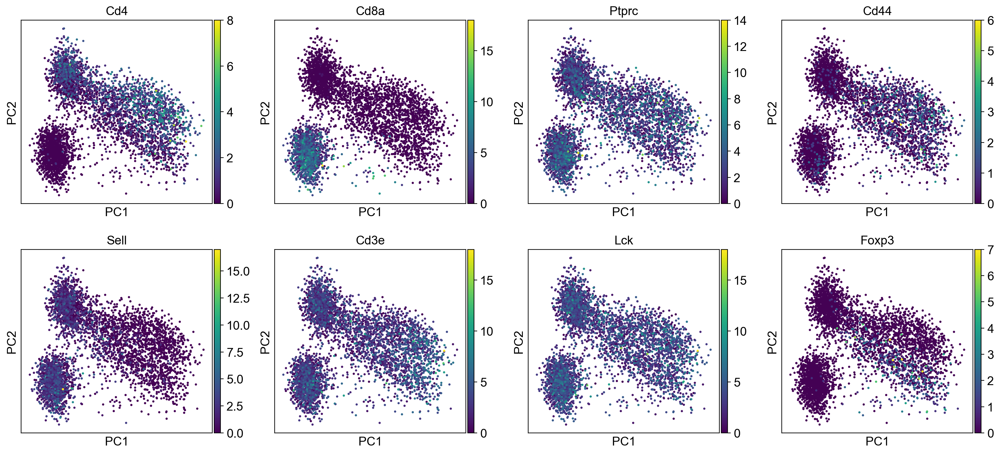

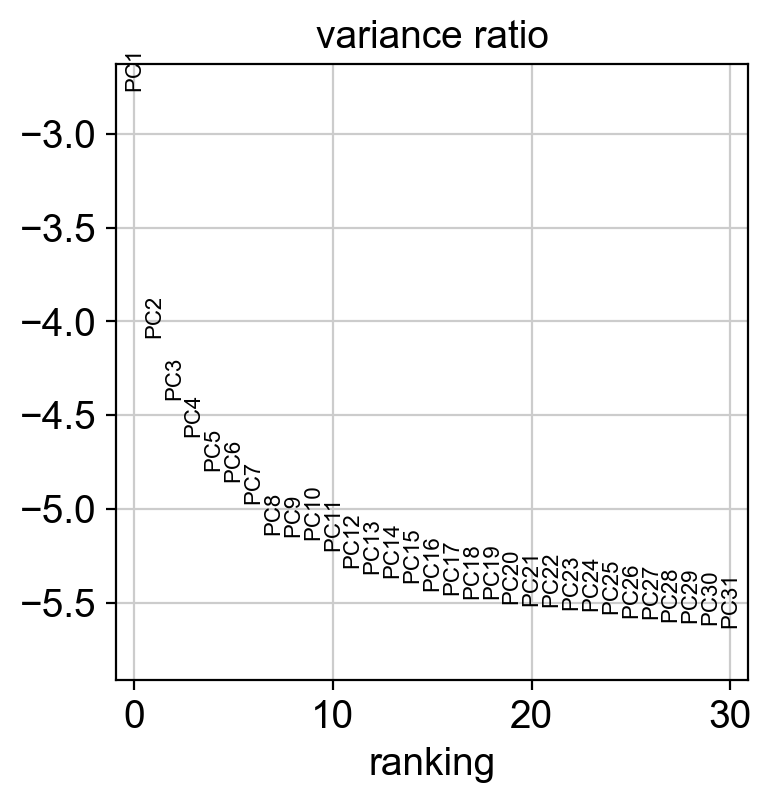

In [22]:
#Repeat dimensional reduction PCA on T cells
T_cell_genes=['Cd4','Cd8a','Ptprc','Cd44','Sell','Cd3e','Lck','Foxp3']
sc.tl.pca(adata_Tcells_early, svd_solver='arpack') # Run PCA.
sc.pl.pca(adata_Tcells_early, color=T_cell_genes) # Plot the PCA and color 
sc.pl.pca_variance_ratio(adata_Tcells_early, log=True) # Plot the variance ratio of PCA components.

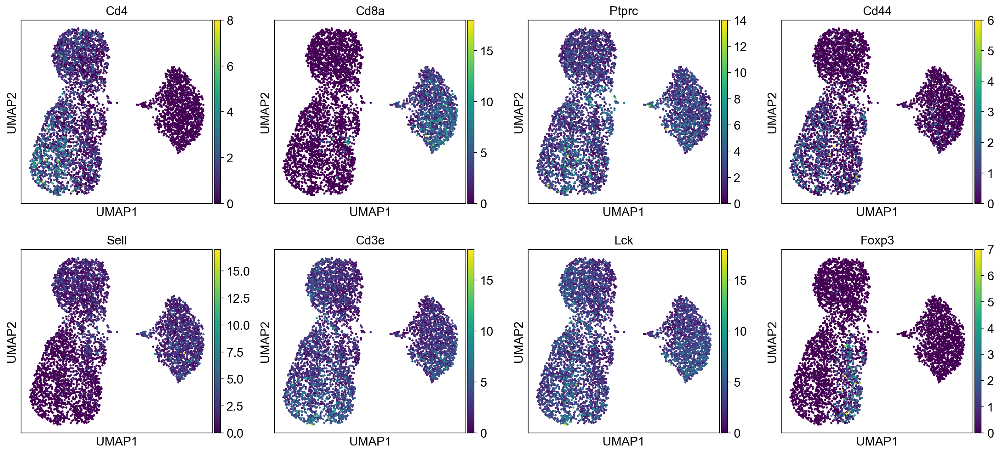

In [23]:
#Do UMAP dimensional reduction on the T cells
sc.pp.neighbors(adata_Tcells_early, n_neighbors=25, n_pcs=7) 
sc.tl.umap(adata_Tcells_early) # Embed the neighborhood graph using UMAP.
sc.pl.umap(adata_Tcells_early, color=T_cell_genes) # Plot the UMAP and color by the genes of interest (very variable genes).

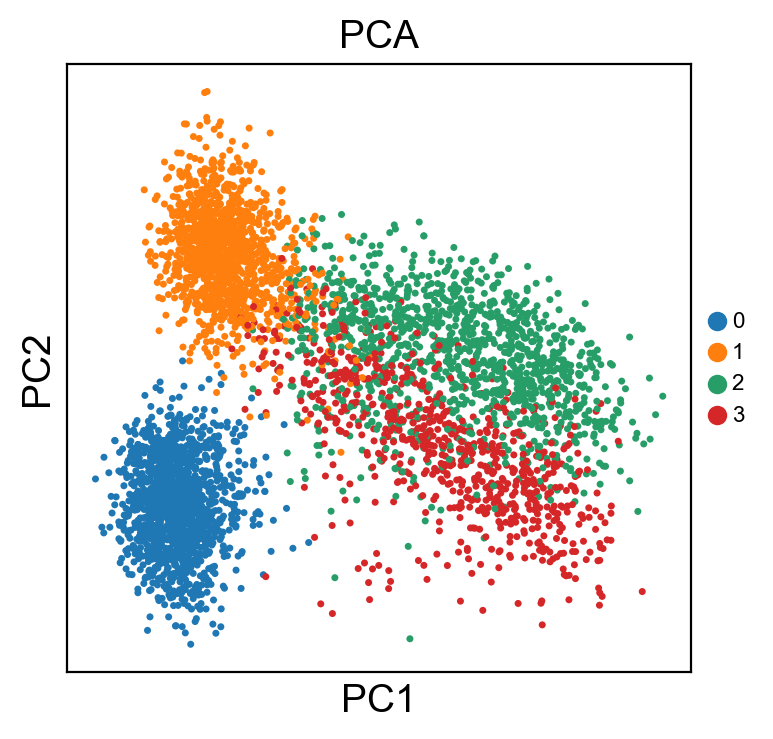

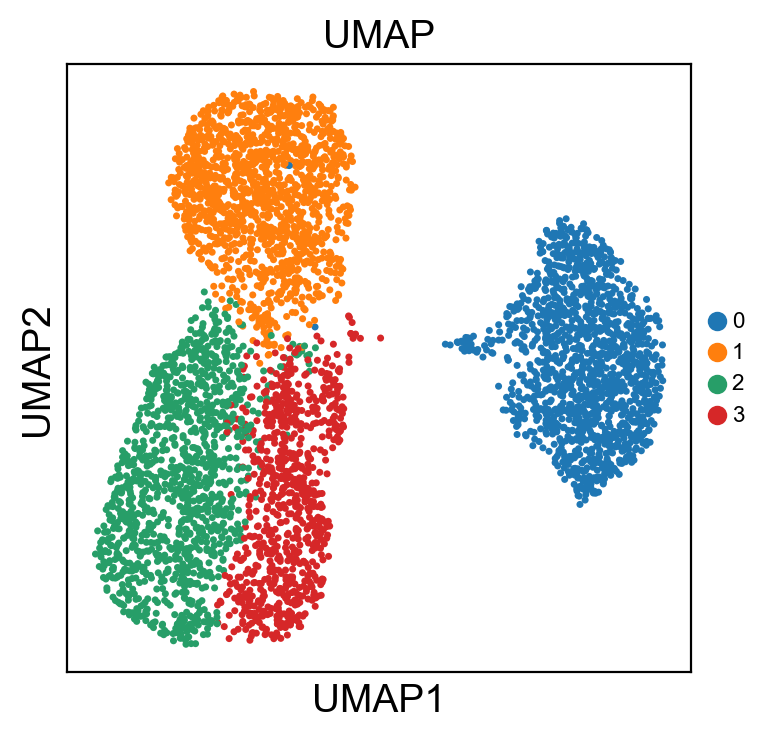

In [24]:
#Leiden clustering of T cells
sc.tl.leiden(adata_Tcells_early, resolution=0.3) # Cluster cells using the Leiden algorithm.
adata_Tcells_early.obs['T_cell_leiden']=adata_Tcells_early.obs['leiden']
sc.pl.pca(adata_Tcells_early, color=['T_cell_leiden'],title='PCA', legend_loc='right margin', legend_fontsize='xx-small') # Plot the PCA and color by the Leiden clusters.
sc.pl.umap(adata_Tcells_early, color=['T_cell_leiden'],title='UMAP', legend_loc='right margin', legend_fontsize='xx-small') # Plot the UMAP and color by the Leiden clusters.

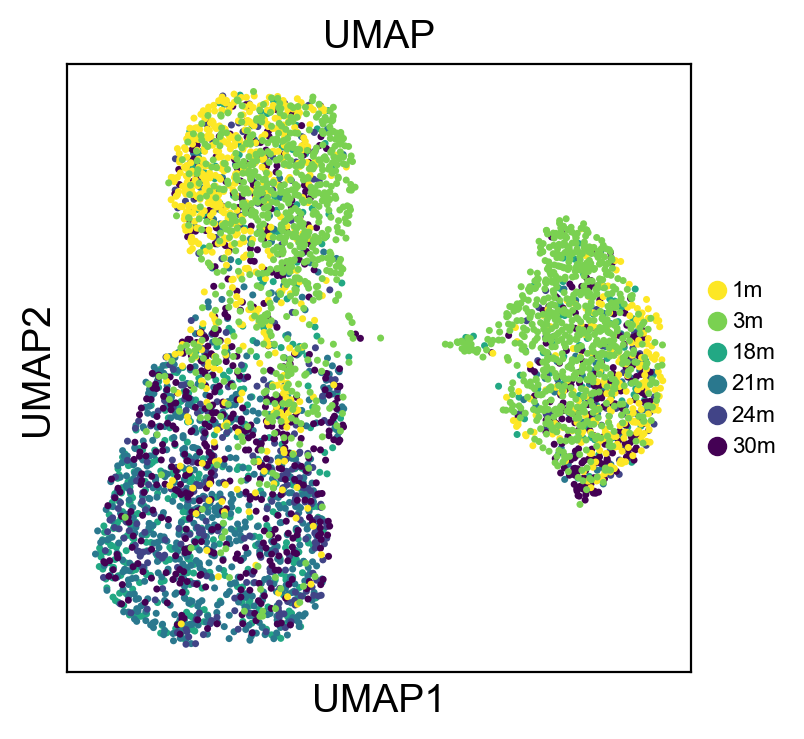

In [25]:
sc.pl.umap(adata_Tcells_early, color=['age'],title='UMAP', legend_loc='right margin', legend_fontsize='xx-small', palette='viridis_r') # Plot the UMAP and color by the Leiden clusters.


END OF EARLY T CELL CLUSTERING

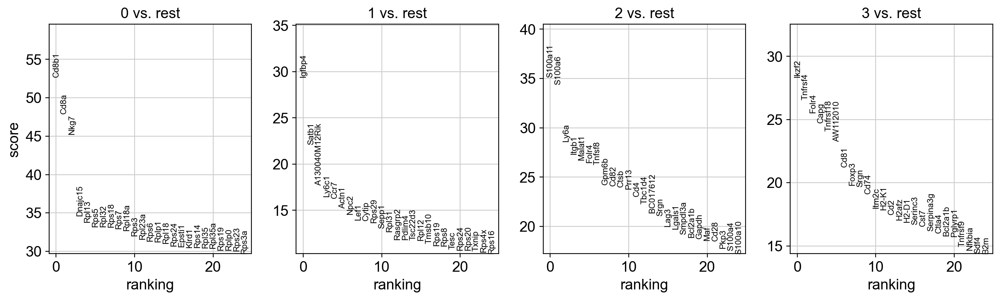

In [26]:
#Top ranked genes from T cell sub-clusters
sc.tl.rank_genes_groups(adata_Tcells_early, 'T_cell_leiden', method='wilcoxon') #get marker genes of each cluster
sc.pl.rank_genes_groups(adata_Tcells_early, n_genes=25, sharey=False) #plot 25 genes and how much variance it explains in each cluster vs. other clusters

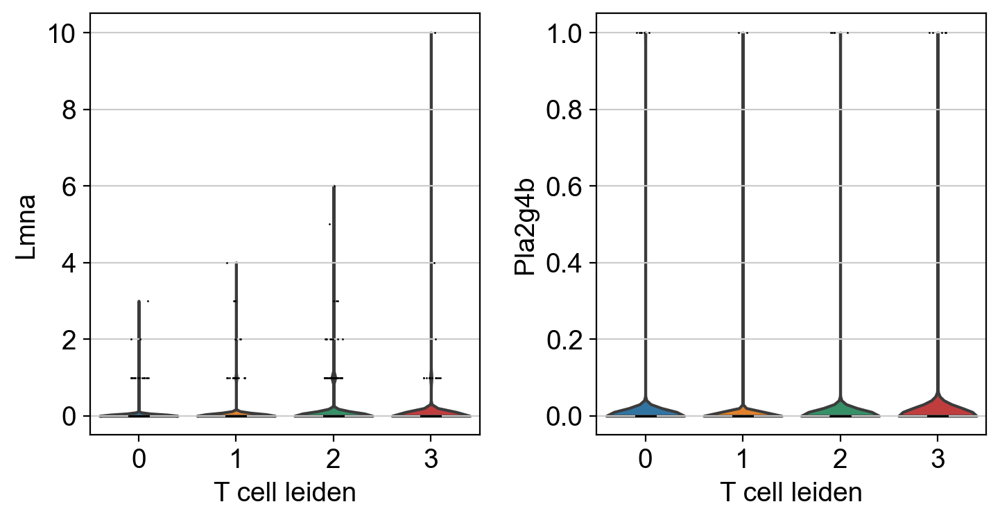

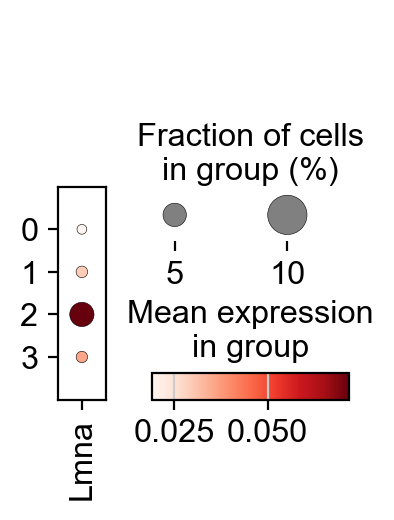

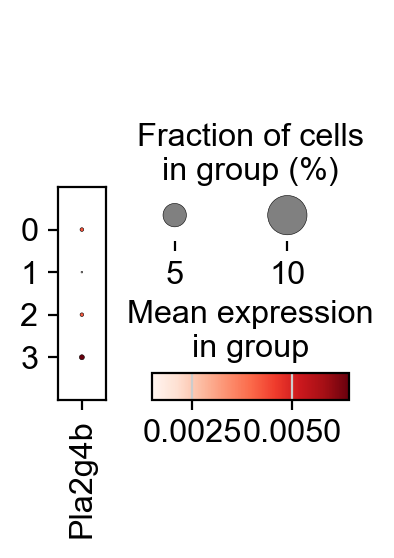

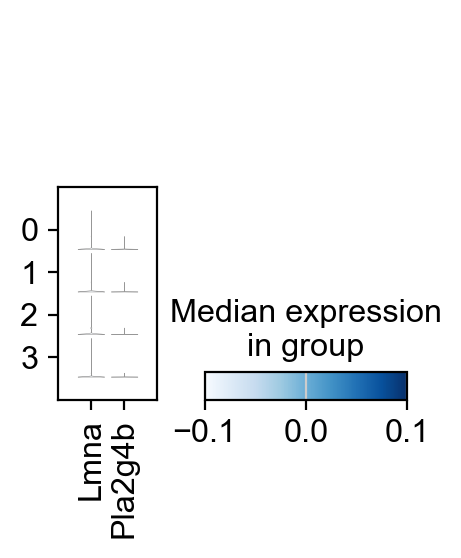

In [27]:
#Look at mechanosensing markers
mechano_genes=['Lmna','Pla2g4b']
sc.pl.violin(adata_Tcells_early, mechano_genes, groupby='T_cell_leiden') #violin plots to visualize marker genes in each cluster
sc.pl.dotplot(adata_Tcells_early, 'Lmna', groupby='T_cell_leiden') # plot droplet plots to visualize marker genes in each cluster\
sc.pl.dotplot(adata_Tcells_early, 'Pla2g4b', groupby='T_cell_leiden') # plot droplet plots to visualize marker genes in each cluster\
sc.pl.stacked_violin(adata_Tcells_early, mechano_genes, groupby='T_cell_leiden', rotation=90) #stacked violin plots to visualize marker genes in each cluster

Splitting T cells to CD8 and CD4s here

In [28]:
#CD4 T cell object
CD4_leiden = ['1', '2', '3']
CD4_adata = adata_Tcells_early[adata_Tcells_early.obs['T_cell_leiden'].isin(CD4_leiden)]
#CD8 T cell object
CD8_adata = adata_Tcells_early[adata_Tcells_early.obs['T_cell_leiden'] == '0']

In [29]:
CD4_adata

View of AnnData object with n_obs × n_vars = 3301 × 16205
    obs: 'age', 'cell', 'cell_ontology_class', 'cell_ontology_id', 'free_annotation', 'method', 'mouse.id', 'n_genes', 'sex', 'subtissue', 'tissue', 'tissue_free_annotation', 'n_counts', 'louvain', 'leiden', 'n_genes_by_counts', 'total_counts', 'T_cell_leiden'
    var: 'n_cells', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'age_colors', 'cell_ontology_class_colors', 'leiden', 'louvain', 'neighbors', 'pca', 'log1p', 'umap', 'T_cell_leiden_colors', 'rank_genes_groups'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [30]:
CD8_adata

View of AnnData object with n_obs × n_vars = 1404 × 16205
    obs: 'age', 'cell', 'cell_ontology_class', 'cell_ontology_id', 'free_annotation', 'method', 'mouse.id', 'n_genes', 'sex', 'subtissue', 'tissue', 'tissue_free_annotation', 'n_counts', 'louvain', 'leiden', 'n_genes_by_counts', 'total_counts', 'T_cell_leiden'
    var: 'n_cells', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'age_colors', 'cell_ontology_class_colors', 'leiden', 'louvain', 'neighbors', 'pca', 'log1p', 'umap', 'T_cell_leiden_colors', 'rank_genes_groups'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

CD4 T cell analysis

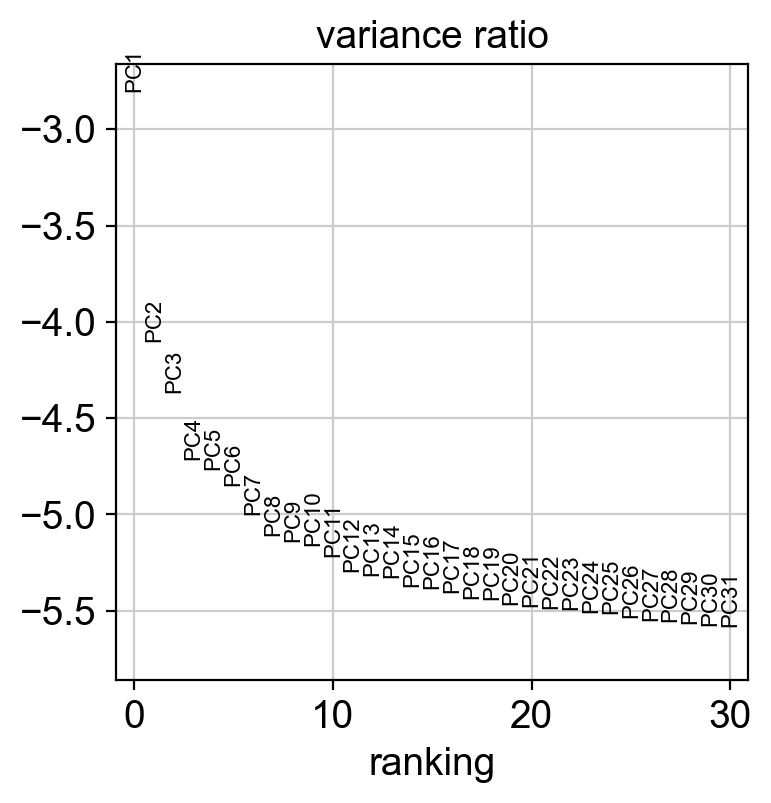

In [31]:
#Repeat dimensional reduction PCA on CD4 T cells
T_cell_genes=['Cd4','Cd8a','Ptprc','Cd44','Sell','Cd3e','Lck','Foxp3']
sc.tl.pca(CD4_adata, svd_solver='arpack') # Run PCA.
#sc.pl.pca(CD4_adata, color=T_cell_genes) # Plot the PCA and color 
sc.pl.pca_variance_ratio(CD4_adata, log=True) # Plot the variance ratio of PCA components.

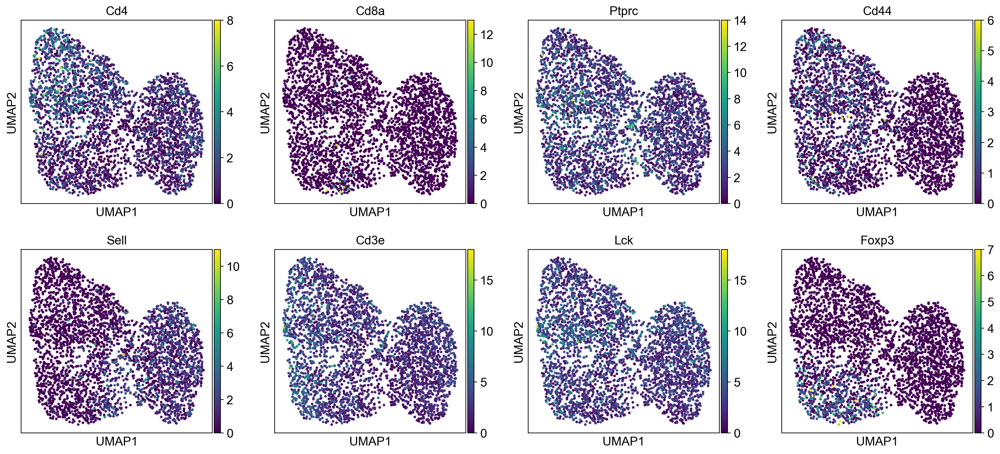

In [32]:
#Do UMAP dimensional reduction on the T cells
sc.pp.neighbors(CD4_adata, n_neighbors=25, n_pcs=7) 
sc.tl.umap(CD4_adata) # Embed the neighborhood graph using UMAP.
sc.pl.umap(CD4_adata, color=T_cell_genes) # Plot the UMAP and color by the genes of interest (very variable genes).

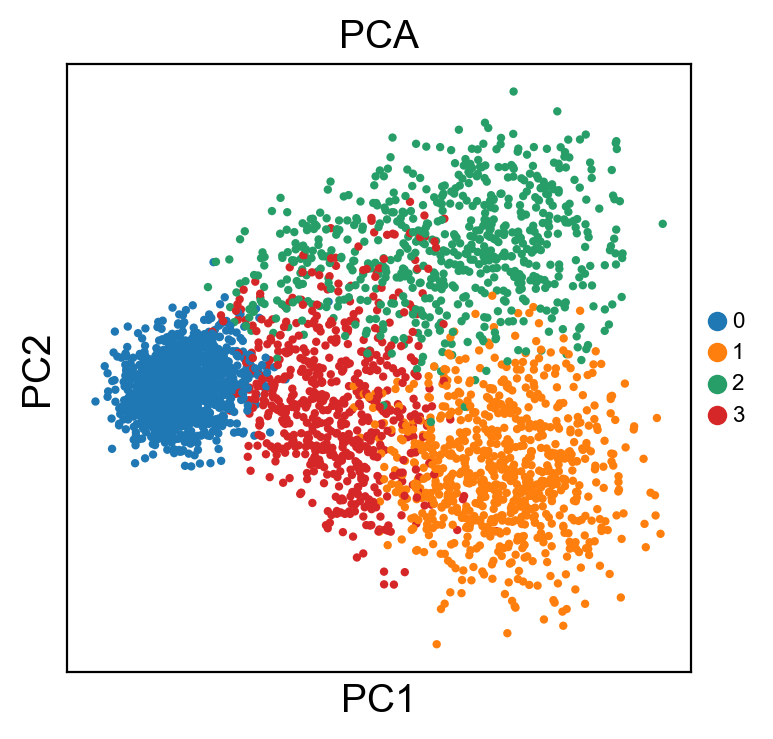

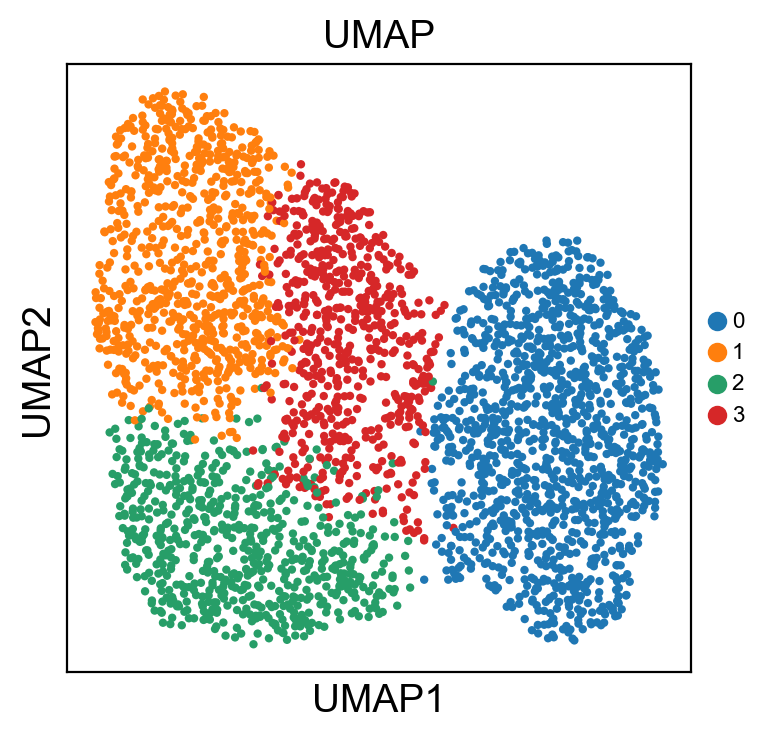

In [33]:
#Leiden clustering of T cells
sc.tl.leiden(CD4_adata, resolution=0.3) # Cluster cells using the Leiden algorithm.
CD4_adata.obs['CD4/8_Tcell_leiden']=CD4_adata.obs['leiden']
sc.pl.pca(CD4_adata, color=['CD4/8_Tcell_leiden'],title='PCA', legend_loc='right margin', legend_fontsize='xx-small') # Plot the PCA and color by the Leiden clusters.
sc.pl.umap(CD4_adata, color=['CD4/8_Tcell_leiden'],title='UMAP', legend_loc='right margin', legend_fontsize='xx-small') # Plot the UMAP and color by the Leiden clusters.

CD4 T cell analysis

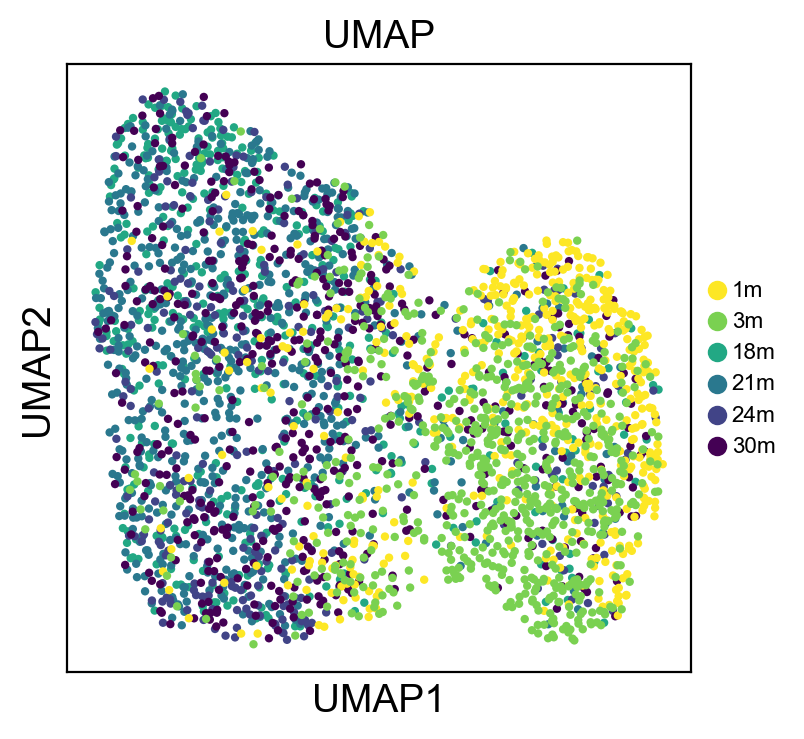

In [34]:
#Age distribution of CD4 T cells
sc.pl.umap(CD4_adata, color=['age'],title='UMAP', legend_loc='right margin', legend_fontsize='xx-small', palette='viridis_r') # Plot the UMAP and color by the Leiden clusters.


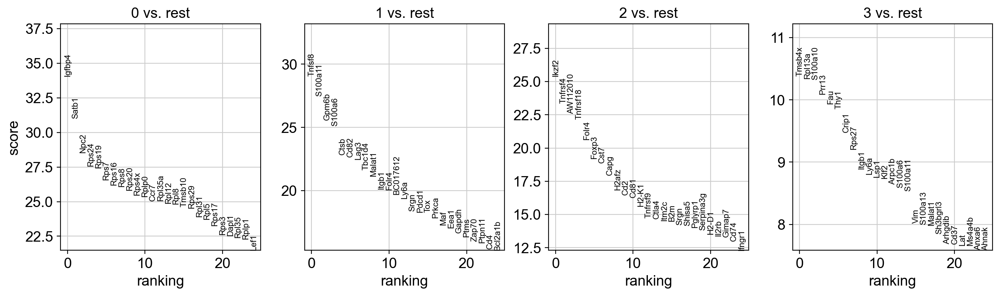

In [35]:
#Top ranked genes from T cell sub-clusters
sc.tl.rank_genes_groups(CD4_adata, 'CD4/8_Tcell_leiden', method='wilcoxon') #get marker genes of each cluster
sc.pl.rank_genes_groups(CD4_adata, n_genes=25, sharey=False) #plot 25 genes and how much variance it explains in each cluster vs. other clusters

In [36]:
#Gene_lists_to_probe
T_cell_base_genes = ['Cd4','Cd8a']
CD4_naive_genes = ['Igfbp4', 'Dapl1','Pde3b','Chd7','Npc2','Ccr7']
CD4_memory_genes = ['Nkg7','Ccl5','Ccr2','Cxcr3','Top2a']
CD4_Treg_genes = ['Foxp3','Il2ra','Ctla4','Klrg1']
CD4_genes_merged = T_cell_base_genes + CD4_naive_genes + CD4_memory_genes + CD4_Treg_genes
#CD4_genes_merged

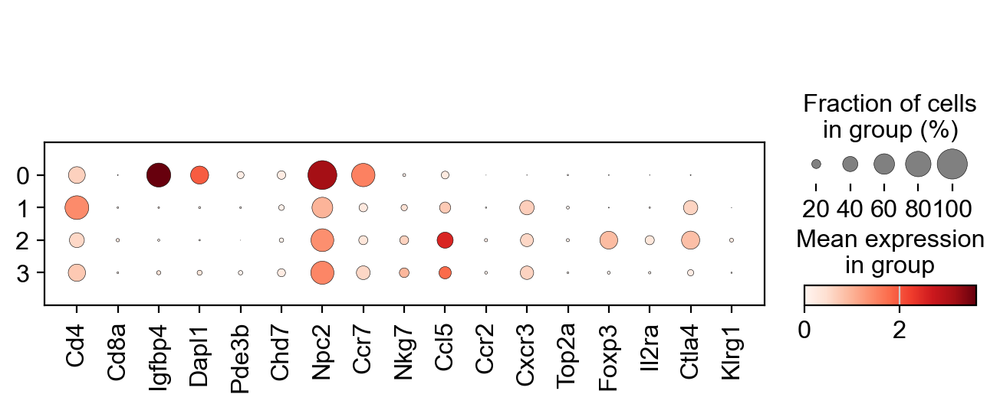

In [37]:
sc.pl.dotplot(CD4_adata, CD4_genes_merged, groupby='CD4/8_Tcell_leiden') 

In [38]:
CD4_adata.obs['CD4/8_Tcell_leiden'].value_counts()

CD4/8_Tcell_leiden
0    1244
1     778
2     666
3     613
Name: count, dtype: int64

In [39]:
#Looking at naive CD4 T cells for downstream analysis
#Taking cluster 0 as our high confidence CD4 naive T cell subset, based on Igfbp4, Dapl1, Npc2, Ccr7
#And to a lesser degree, Pde3b, Chd7
naive_CD4_adata = CD4_adata[CD4_adata.obs['CD4/8_Tcell_leiden'] == '0']

In [40]:
naive_CD4_adata

View of AnnData object with n_obs × n_vars = 1244 × 16205
    obs: 'age', 'cell', 'cell_ontology_class', 'cell_ontology_id', 'free_annotation', 'method', 'mouse.id', 'n_genes', 'sex', 'subtissue', 'tissue', 'tissue_free_annotation', 'n_counts', 'louvain', 'leiden', 'n_genes_by_counts', 'total_counts', 'T_cell_leiden', 'CD4/8_Tcell_leiden'
    var: 'n_cells', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'age_colors', 'cell_ontology_class_colors', 'leiden', 'louvain', 'neighbors', 'pca', 'log1p', 'umap', 'T_cell_leiden_colors', 'rank_genes_groups', 'CD4/8_Tcell_leiden_colors'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

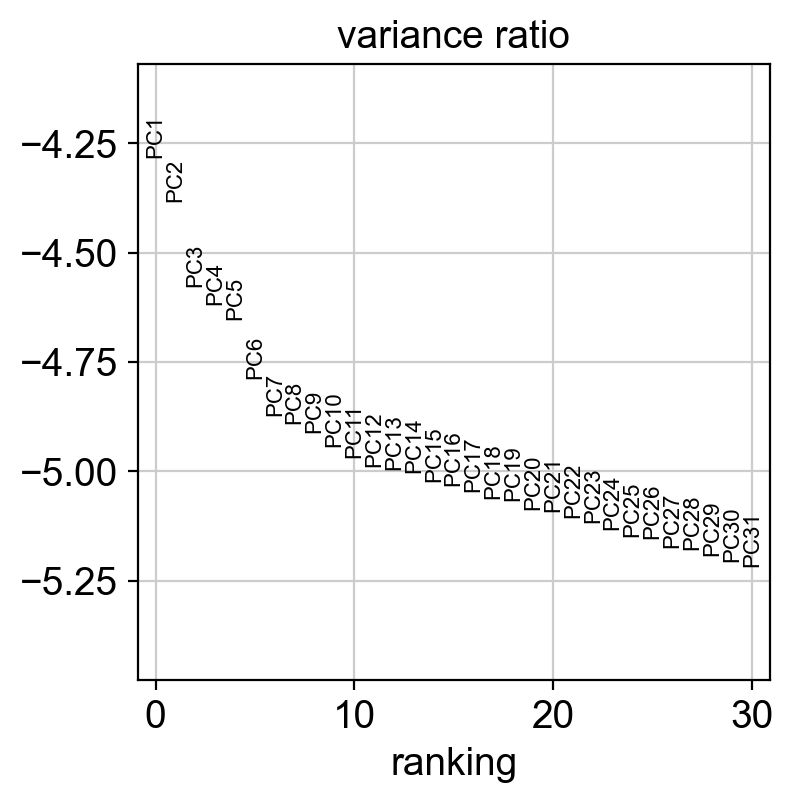

In [41]:
#Repeat dimensional reduction PCA on CD4 T cells
sc.tl.pca(naive_CD4_adata, svd_solver='arpack') # Run PCA.
#sc.pl.pca(naive_CD4_adata, color=CD4_genes_merged) # Plot the PCA and color 
sc.pl.pca_variance_ratio(naive_CD4_adata, log=True) # Plot the variance ratio of PCA components.

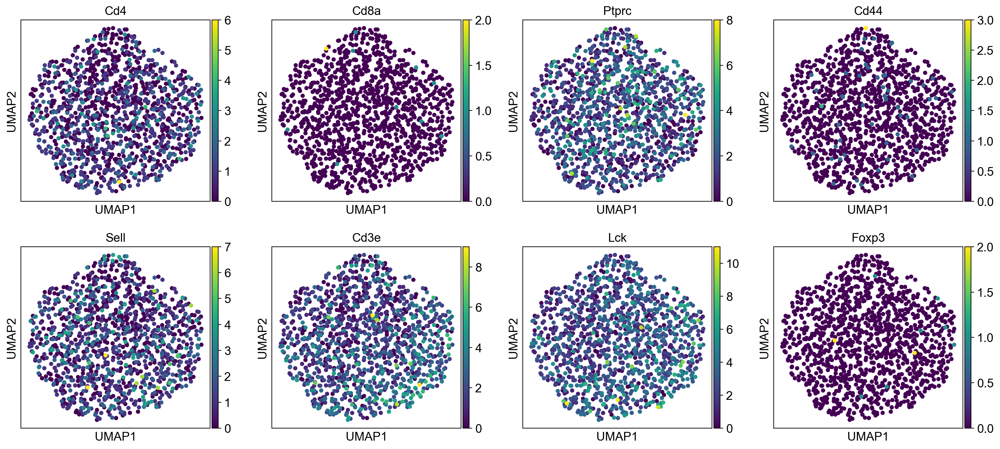

In [42]:
#Do UMAP dimensional reduction on the T cells
sc.pp.neighbors(naive_CD4_adata, n_neighbors=25, n_pcs=6) # Compute the neighborhood graph of adata using up to 6 PCAs (when the variance ratio starts falling off)
sc.tl.umap(naive_CD4_adata) # Embed the neighborhood graph using UMAP.
sc.pl.umap(naive_CD4_adata, color=T_cell_genes) # Plot the UMAP and color by the genes of interest (very variable genes).

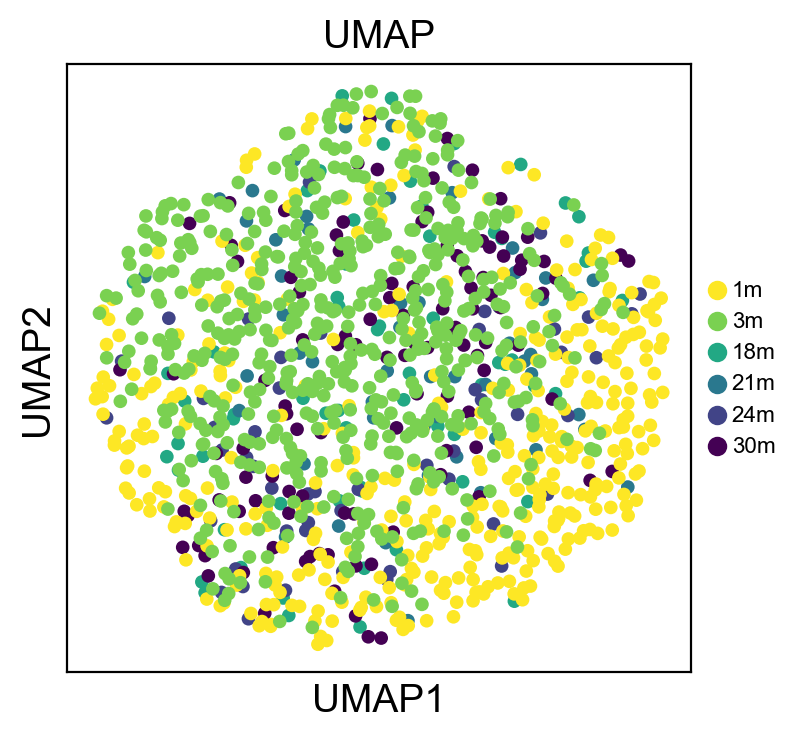

In [43]:
#Age distribution of naive CD4 T cells
sc.pl.umap(naive_CD4_adata, color=['age'],title='UMAP', legend_loc='right margin', legend_fontsize='xx-small', palette='viridis_r') # Plot the UMAP and color by the Leiden clusters.

In [44]:
naive_CD4_adata.obs['age_dnn_label'] = naive_CD4_adata.obs['age'].map({"1m":'young (1m)', 
                                                            "3m":'adult (3m)',
                                                            "18m":'old (18m-30m)',
                                                            "21m":'old (18m-30m)',
                                                            "24m":'old (18m-30m)',
                                                            "30m":'old (18m-30m)'})

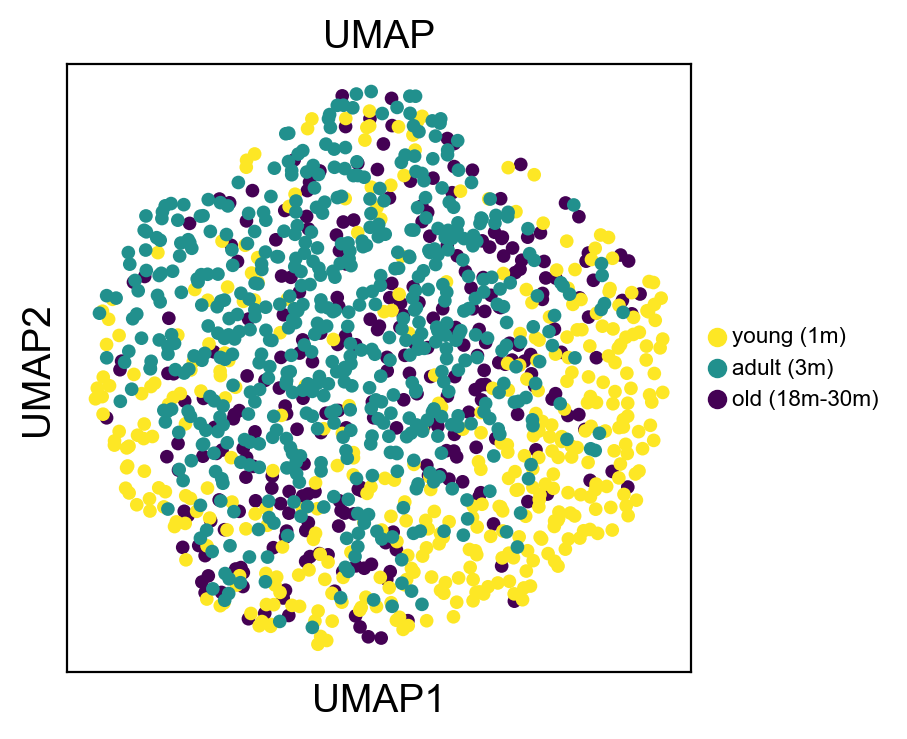

In [45]:
#Age distribution of naive CD4 T cells
groups_order = ['young (1m)', 'adult (3m)', 'old (18m-30m)']
naive_CD4_adata.obs['age_dnn_label'] = pd.Categorical(naive_CD4_adata.obs['age_dnn_label'], categories=groups_order, ordered=True)
sc.pl.umap(naive_CD4_adata, color=['age_dnn_label'],title='UMAP', legend_loc='right margin', legend_fontsize='xx-small', palette='viridis_r') # Plot the UMAP and color by the Leiden clusters.

In [46]:
naive_CD4_adata.obs['age_dnn_label'] = naive_CD4_adata.obs['age_dnn_label'].astype(str)

index
AAGCCGCCAACACCTA-1-19-0-0      old (18m-30m)
ACAGCTAGTCTTTCAT-1-19-0-0      old (18m-30m)
ATAGACCCAATCGAAA-1-19-0-0      old (18m-30m)
CAAGGCCAGATGCCTT-1-19-0-0      old (18m-30m)
CCCAGTTAGAAGATTC-1-19-0-0      old (18m-30m)
                                   ...      
10X_P7_6_TTTATGCTCCACGACG-1       adult (3m)
10X_P7_6_TTTGCGCCAACTGGCC-1       adult (3m)
10X_P7_6_TTTGGTTCACTTGGAT-1       adult (3m)
10X_P7_6_TTTGGTTGTCAGCTAT-1       adult (3m)
10X_P7_6_TTTGTCATCTCAACTT-1       adult (3m)
Name: age_dnn_label, Length: 1244, dtype: object

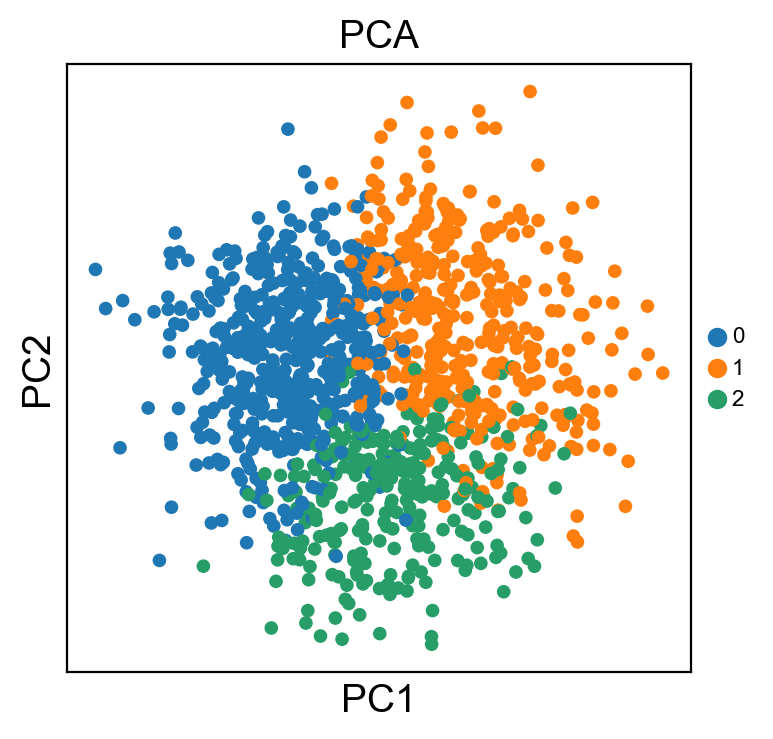

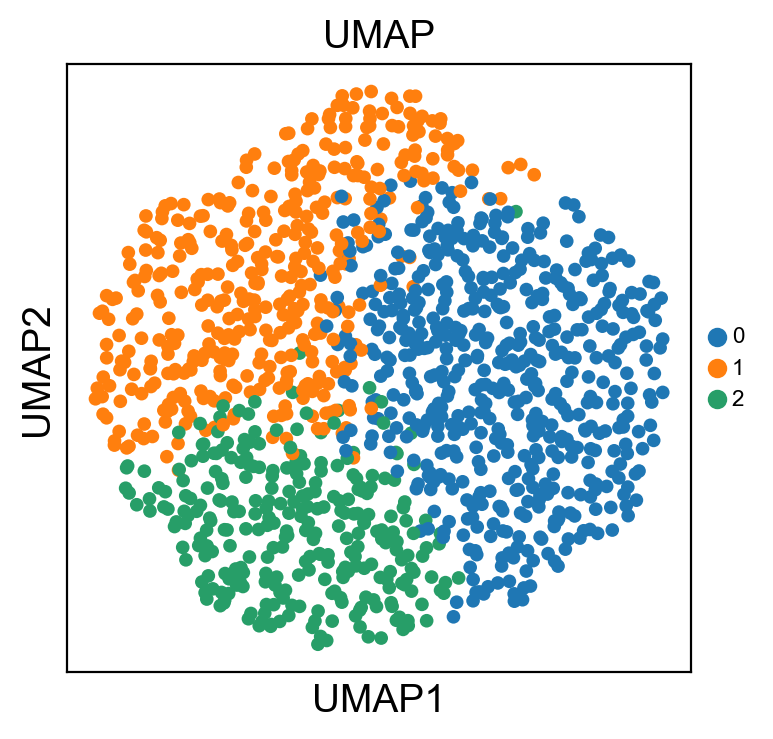

In [47]:
#Leiden clustering of T cells
#Not reliable, just doing it for exploration
sc.tl.leiden(naive_CD4_adata, resolution=0.4) # Cluster cells using the Leiden algorithm.
naive_CD4_adata.obs['naive_CD4_Tcell_leiden']=naive_CD4_adata.obs['leiden']
sc.pl.pca(naive_CD4_adata, color=['naive_CD4_Tcell_leiden'],title='PCA', legend_loc='right margin', legend_fontsize='xx-small') # Plot the PCA and color by the Leiden clusters.
sc.pl.umap(naive_CD4_adata, color=['naive_CD4_Tcell_leiden'],title='UMAP', legend_loc='right margin', legend_fontsize='xx-small') # Plot the UMAP and color by the Leiden clusters.

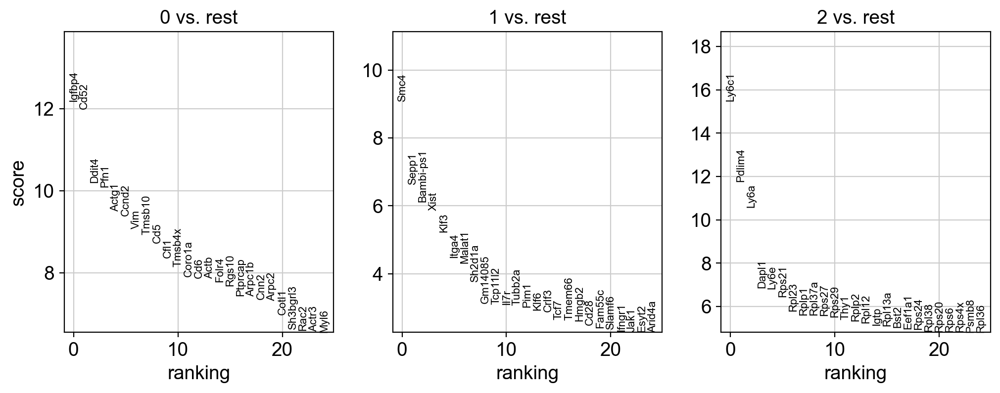

In [48]:
#Top ranked genes from naive CD4 T cell clusters
sc.tl.rank_genes_groups(naive_CD4_adata, 'naive_CD4_Tcell_leiden', method='wilcoxon') #get marker genes of each cluster
sc.pl.rank_genes_groups(naive_CD4_adata, n_genes=25, sharey=False) #plot 25 genes and how much variance it explains in each cluster vs. other clusters

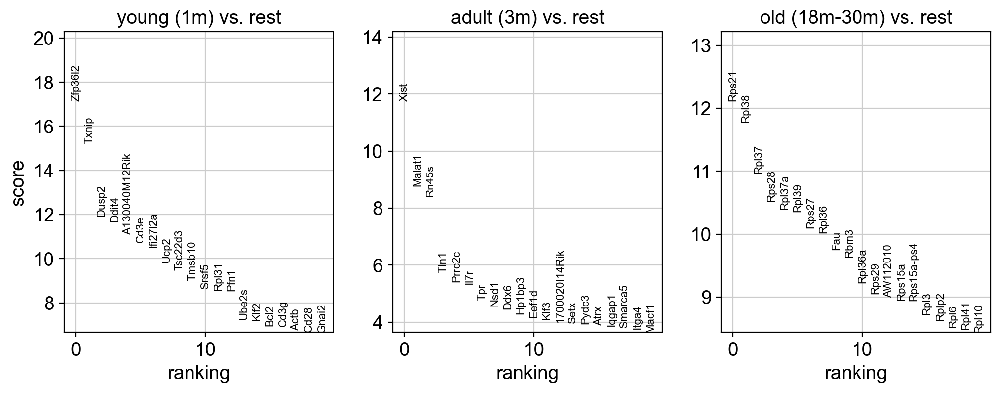

In [49]:
#Top ranked genes from naive CD4 T cell clusters
sc.tl.rank_genes_groups(naive_CD4_adata, 'age_dnn_label', method='wilcoxon') #get marker genes of each cluster
sc.pl.rank_genes_groups(naive_CD4_adata, n_genes=20, sharey=False) #plot 25 genes and how much variance it explains in each cluster vs. other clusters

In [50]:
# Get a list of ranked genes for each group
ranked_genes = naive_CD4_adata.uns['rank_genes_groups']
#ranked_genes

In [51]:
young_genes_wilcoxon = list(ranked_genes['names']['young (1m)'])[0:99]
adult_genes_wilcoxon = list(ranked_genes['names']['adult (3m)'])[0:99]
old_genes_wilcoxon = list(ranked_genes['names']['old (18m-30m)'])[0:99]
all_wilcoxon_genes = set(young_genes_wilcoxon + adult_genes_wilcoxon + old_genes_wilcoxon)
#all_wilcoxon_genes
#young_genes_wilcoxon

In [52]:
#Reducing gene list to highly variable genes
sc.pp.highly_variable_genes(naive_CD4_adata, min_mean=0.0125, min_disp=0.5) # Identify highly variable genes.
#Set adata to be only the highly variable genes
naive_CD4_adata = naive_CD4_adata[:, naive_CD4_adata.var.highly_variable]

In [53]:
naive_CD4_adata

View of AnnData object with n_obs × n_vars = 1244 × 3707
    obs: 'age', 'cell', 'cell_ontology_class', 'cell_ontology_id', 'free_annotation', 'method', 'mouse.id', 'n_genes', 'sex', 'subtissue', 'tissue', 'tissue_free_annotation', 'n_counts', 'louvain', 'leiden', 'n_genes_by_counts', 'total_counts', 'T_cell_leiden', 'CD4/8_Tcell_leiden', 'age_dnn_label', 'naive_CD4_Tcell_leiden'
    var: 'n_cells', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'age_colors', 'cell_ontology_class_colors', 'leiden', 'louvain', 'neighbors', 'pca', 'log1p', 'umap', 'T_cell_leiden_colors', 'rank_genes_groups', 'CD4/8_Tcell_leiden_colors', 'age_dnn_label_colors', 'naive_CD4_Tcell_leiden_colors', 'hvg'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

Start of DNN part 

In [54]:
print(tf.__version__)

2.15.0


In [55]:
nvCD4_dat = naive_CD4_adata

In [56]:
nvCD4_dat.obs['age'].value_counts()

age
3m     553
1m     411
30m    112
18m     65
24m     52
21m     51
Name: count, dtype: int64

In [57]:
nvCD4_dat.obs['age_dnn_label']=nvCD4_dat.obs['age']

In [58]:
nvCD4_dat.obs['age_dnn_label'] = nvCD4_dat.obs['age_dnn_label'].map({"1m":0, 
                                                            "3m":1,
                                                            "18m":2,
                                                            "21m":2,
                                                            "24m":2,
                                                            "30m":2})

In [59]:
nvCD4_dat.obs['age_dnn_label'].value_counts()

age_dnn_label
1    553
0    411
2    280
Name: count, dtype: int64

In [60]:
df_nvCD4_dat = nvCD4_dat.to_df()

In [61]:
df_age_nvCD4 = pd.DataFrame(nvCD4_dat.obs['age_dnn_label'])
df_nvCD4_dat = pd.merge(df_nvCD4_dat, df_age_nvCD4, on='index', how='inner')

In [62]:
#Function to get a test_set from each age group
def func_getTestSet(df,frac = 0.1,rand_s=rand_seed):
    sample_df = df.sample(frac=0.1, random_state=rand_s)
    return(sample_df)

In [63]:
test_age0 = func_getTestSet(df_nvCD4_dat[df_nvCD4_dat.age_dnn_label == 0])
test_age1 = func_getTestSet(df_nvCD4_dat[df_nvCD4_dat.age_dnn_label == 1])
test_age2 = func_getTestSet(df_nvCD4_dat[df_nvCD4_dat.age_dnn_label == 2])
#test_age3 = func_getTestSet(df_nvCD4_dat[df_nvCD4_dat.age_dnn_label == 3])
#test_age4 = func_getTestSet(df_nvCD4_dat[df_nvCD4_dat.age_dnn_label == 4])
#test_age5 = func_getTestSet(df_nvCD4_dat[df_nvCD4_dat.age_dnn_label == 5])

df_nvCD4_test_dnn = pd.concat([test_age0, test_age1, test_age2], ignore_index=False)
df_nvCD4_test_dnn

,Rb1cc1,Adhfe1,Ncoa2,Lactb2,Gm5523,Rpl7,Tmem14a,Khdc1a,Col19a1,1700001G17Rik,...,Trappc2,Gm8817,Prps2,Mid1,Tmlhe,Zf12,Kdm5d,Uty,Usp9y,age_dnn_label
index,,,,,,,,,,,,,,,,,,,,,
ATAAGAGCAGCTTCGG-1-54-1-0,0.000000,0.0,0.0,0.0,0.000000,2.871052,0.0,0.0,0.0,0.0,...,0.00000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0
GACTAACCAGTGACAG-1-54-1-0,0.000000,0.0,0.0,0.0,0.000000,2.863093,0.0,0.0,0.0,0.0,...,0.00000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0
AAACCTGAGTAGGCCA-1-54-1-0,0.000000,0.0,0.0,0.0,0.000000,2.708212,0.0,0.0,0.0,0.0,...,0.00000,0.0,0.000000,0.0,0.0,0.0,2.667725,0.0,0.0,0
CGCCAAGTCCTGCTTG-1-54-1-0,2.239836,0.0,0.0,0.0,0.000000,2.747255,0.0,0.0,0.0,0.0,...,0.00000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0
TACGGTATCTCTGCTG-1-54-1-0,0.000000,0.0,0.0,0.0,0.000000,2.891985,0.0,0.0,0.0,0.0,...,3.26596,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GCGCAACCATCTCCCA-1-85-0-0,0.000000,0.0,0.0,0.0,0.000000,3.071890,0.0,0.0,0.0,0.0,...,0.00000,0.0,2.036109,0.0,0.0,0.0,0.000000,0.0,0.0,2
CATCCACGTATCAGTC-1-10-1-0,0.000000,0.0,0.0,0.0,0.000000,2.984641,0.0,0.0,0.0,0.0,...,0.00000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,2
AGAATAGCACCGCTAG-1-20-0-0,0.000000,0.0,0.0,0.0,0.000000,2.758438,0.0,0.0,0.0,0.0,...,0.00000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,2


In [64]:
df_nvCD4_test_dnn.age_dnn_label.value_counts()

age_dnn_label
1    55
0    41
2    28
Name: count, dtype: int64

In [65]:
#Drop test set cells from training set 
#common_rows = pd.merge(df_nvCD4_test_dnn, df_nvCD4_dat, how='inner', on='index')
test_indexes = df_nvCD4_test_dnn.index
#test_indexes
# Drop common rows from df_nvCD4_dat (training set)
df_nvCD4_train_dnn = df_nvCD4_dat[~df_nvCD4_dat.index.isin(test_indexes)]
df_nvCD4_train_dnn 

,Rb1cc1,Adhfe1,Ncoa2,Lactb2,Gm5523,Rpl7,Tmem14a,Khdc1a,Col19a1,1700001G17Rik,...,Trappc2,Gm8817,Prps2,Mid1,Tmlhe,Zf12,Kdm5d,Uty,Usp9y,age_dnn_label
index,,,,,,,,,,,,,,,,,,,,,
AAGCCGCCAACACCTA-1-19-0-0,0.000000,0.0,0.0,0.000000,0.0,2.827498,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
ACAGCTAGTCTTTCAT-1-19-0-0,0.000000,0.0,0.0,0.000000,0.0,3.007388,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
ATAGACCCAATCGAAA-1-19-0-0,2.305139,0.0,0.0,0.000000,0.0,2.913782,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
CAAGGCCAGATGCCTT-1-19-0-0,0.000000,0.0,0.0,0.000000,0.0,2.837704,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
CCCAGTTAGAAGATTC-1-19-0-0,0.000000,0.0,0.0,0.000000,0.0,2.976786,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10X_P7_6_TTTATGCCAGCCTATA-1,0.000000,0.0,0.0,0.000000,0.0,2.933252,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
10X_P7_6_TTTATGCTCCACGACG-1,0.000000,0.0,0.0,0.000000,0.0,2.942699,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
10X_P7_6_TTTGCGCCAACTGGCC-1,0.000000,0.0,0.0,0.000000,0.0,3.051857,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1


In [66]:
#creating dictionary with the data
data = {'training data': np.array(df_nvCD4_train_dnn.iloc[:, :-1]),
        'labels':np.array(df_nvCD4_train_dnn.age_dnn_label)}
#data['labels']

Round 1 modeling attempt 
(from https://medium.com/analytics-vidhya/deep-neural-networks-tutorial-with-tensorflow-d545e4417977)

Advice learnt from first passes 
1. In order to maximize accuracy:
   a. Made last layer have 1 unit
2. Too many layers can reduce accuracy
3. Use low # of epochs (e.g. 5) when trying to determine model structure
4. Recommended default learning_rate: 1e-7

In [67]:
#Creating keras format train and test label
train_labels = to_categorical(df_nvCD4_train_dnn.age_dnn_label)
test_labels = to_categorical(df_nvCD4_test_dnn.age_dnn_label)

In [68]:
#Notes
#Good results with:
#3707, 800, 100, 1. Learning rate:1e-5
#Bayesian optimization for hyperparameter opti
#Number of nodes per layer, activation func, dropout_rate, batch_size, learning_rate


#After model is done:
#Search embedding of middle layer (output)
#Plot embedding (of nodes) and plot UMAP

#Feature importance SHAP or SHAPLY score for gene interpretaiton

In [69]:
import matplotlib.pyplot as plt

Trying keras_tuner for hyperparameter optimization

In [70]:
class MyHyperModel(keras_tuner.HyperModel):
    def build(self, hp):
        model = keras.Sequential()
        drp_rate = hp.Choice('rate', [0.1,0.25,0.5])
        act_func = hp.Choice('activation', ['relu','tanh'])
        model.add(keras.layers.Dense(
            hp.Choice('units_1', [1000, 800, 700, 600, 500, 300]), 
            act_func, 
            input_shape=[3707,], 
            name = 'layer_1'))
        model.add(keras.layers.Dropout(
            rate = drp_rate,
            seed=rand_seed))
        model.add(keras.layers.Dense(
            hp.Choice('units_2', [125, 100, 85, 60, 50, 35]),
            act_func, 
            name = 'layer_2'))
        model.add(keras.layers.Dropout(
            rate = drp_rate,
            seed=rand_seed))
        model.add(keras.layers.Dense(
            hp.Choice('units_3', [250, 200, 150, 125, 100, 75]),
            act_func,
            name = 'layer_3'))
        model.add(keras.layers.Dropout(
            rate = drp_rate,
            seed=rand_seed))
        model.add(keras.layers.Dense(units=3, activation='softmax', name = 'final_layer'))
        opt = keras.optimizers.Adam(
            learning_rate = 1e-3)
        model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['acc'])   
        return model

    def fit(self, hp, model, *args, **kwargs):
        return model.fit(
            *args,
            batch_size=hp.Choice("batch_size", [64, 128, 256]),
            **kwargs,
        )


def build_model(hp):
    model = keras.Sequential()
    drp_rate = hp.Choice('rate', [0.1,0.3,0.5])
    act_func = hp.Choice('activation', ['relu','tanh'])
    model.add(keras.layers.Dense(
        hp.Choice('units_1', [1200, 1000, 800,500,300, 200, 100]), 
        act_func, 
        input_shape=[3707,], 
        name = 'layer_1'))
    model.add(keras.layers.Dropout(
        rate = drp_rate,
        seed=rand_seed))
    model.add(keras.layers.Dense(
        hp.Choice('units_2', [85, 65, 50, 35, 25]),
        act_func, 
        name = 'layer_2'))
    model.add(keras.layers.Dropout(
        rate = drp_rate,
        seed=rand_seed))
    model.add(keras.layers.Dense(
        hp.Choice('units_3', [400,300,250,200,150,100, 50, 35]),
        act_func,
        name = 'layer_3'))
    model.add(keras.layers.Dropout(
        rate = drp_rate,
        seed=rand_seed))
    model.add(keras.layers.Dense(units=3, activation='softmax', name = 'final_layer'))
    opt = keras.optimizers.Adam(
        learning_rate = hp.Choice('learning_rate',[1e-3,1e-5]))
    model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['acc'])   
    return model

In [71]:
tuner = keras_tuner.BayesianOptimization(
    MyHyperModel(),
    objective='val_loss',
    executions_per_trial = 3,
    max_trials=100 ,
    seed=rand_seed,
    directory='youngOld_test_DNN_dir',
    project_name='231220_young_old_DNN_tuner_newLabel_HyperModel_v3_3execs_100maxTrial')

Reloading Tuner from youngOld_test_DNN_dir/231220_young_old_DNN_tuner_newLabel_HyperModel_v3_3execs_100maxTrial/tuner0.json


In [72]:
import time
start_time = time.time()
callback = keras.callbacks.EarlyStopping(monitor='val_loss',patience=5, restore_best_weights = True)
#batch_size = 64 chosen to limit hyperparameter settings
tuner.search(data['training data'], train_labels, epochs=5000, validation_split=0.2, 
                 shuffle=True, callbacks=[callback],verbose=1)
end_time = time.time()

In [73]:
best_model = tuner.get_best_models(num_models=1)[0]

In [74]:
best_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer_1 (Dense)             (None, 800)               2966400   
                                                                 
 dropout (Dropout)           (None, 800)               0         
                                                                 
 layer_2 (Dense)             (None, 85)                68085     
                                                                 
 dropout_1 (Dropout)         (None, 85)                0         
                                                                 
 layer_3 (Dense)             (None, 125)               10750     
                                                                 
 dropout_2 (Dropout)         (None, 125)               0         
                                                                 
 final_layer (Dense)         (None, 3)                 3

In [75]:
test_data = {'testing data': np.array(df_nvCD4_test_dnn.iloc[:, :-1]),
        'labels':np.array(df_nvCD4_test_dnn.age_dnn_label)}

In [76]:
test_loss, test_acc = best_model.evaluate(test_data['testing data'], test_labels)
print(f'Test accuracy: {test_acc}')

4/4 [==============================] - 1s 7ms/step - loss: 0.7416 - acc: 0.7258
Test accuracy: 0.725806474685669


In [77]:
best_hps = tuner.get_best_hyperparameters(num_trials=5)

In [78]:
HP_list = []
for hp in best_hps:
    HP_list.append(hp.get_config()["values"])
HP_df = pd.DataFrame(HP_list)

In [79]:
HP_df

,rate,activation,units_1,units_2,units_3,batch_size
0,0.1,relu,800,85,125,256
1,0.5,tanh,500,85,200,128
2,0.1,relu,800,100,125,128
3,0.5,tanh,600,50,200,128
4,0.5,tanh,1000,50,250,64


In [80]:
model_chosen = best_model

In [81]:
#Rebuild model with previous specs
#model_chosen = tf.keras.Sequential()
#model_chosen.add(tf.keras.layers.Dense(units=800, activation='relu', input_shape=[3707,], name='layer_1'))
#model_chosen.add(tf.keras.layers.Dropout(0.1, seed=rand_seed))
#model_chosen.add(tf.keras.layers.Dense(units=85, activation='relu', name='layer_2'))
#model_chosen.add(tf.keras.layers.Dropout(0.1, seed=rand_seed))
#model_chosen.add(tf.keras.layers.Dense(units=125, activation='relu', name='layer_3'))
#model_chosen.add(tf.keras.layers.Dropout(0.1, seed=rand_seed))
#model_chosen.add(tf.keras.layers.Dense(units=3, activation='softmax', name='final_layer'))
#opt = tf.keras.optimizers.Adam(learning_rate=1e-3)
#model_chosen.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['acc'])

#callback = keras.callbacks.EarlyStopping(monitor='val_loss',patience=5, restore_best_weights = True)
#hist = model_chosen.fit(data['training data'], train_labels, epochs=5000, validation_split=0.2, 
                 #shuffle=True, callbacks=[callback],verbose=1, batch_size = 256)

In [82]:
test_loss, test_acc = model_chosen.evaluate(test_data['testing data'], test_labels)
print(f'Test accuracy: {test_acc}')

4/4 [==============================] - 0s 6ms/step - loss: 0.7416 - acc: 0.7258
Test accuracy: 0.725806474685669


In [83]:
import umap
def plot_UMAP_hiddenLayer_embedding(data_predict, 
                                    data_label, 
                                    layer_name = 'layer_2', 
                                    model = model_chosen, 
                                    legend_loc = "lower left"):
    
    hidden_layer_model = models.Model(inputs=model.input,
                                  outputs=model.get_layer(layer_name).output)
    hidden_layer_predictions = hidden_layer_model.predict(data_predict)
    layer_pred = pd.DataFrame(hidden_layer_predictions)
    reducer = umap.UMAP(n_components=2)
    umap_result = reducer.fit_transform(layer_pred)

    #Plot UMAP of embedding
    fig, ax = plt.subplots()
    scatter = ax.scatter(umap_result[:, 0], umap_result[:, 1], c=data_label, cmap = 'viridis_r')
    
    # produce a legend with the unique colors from the scatter
    #legend1 = ax.legend(*scatter.legend_elements(),loc=legend_loc, title="Groups")
    #ax.add_artist(legend1)
    
    # produce a legend with a cross-section of sizes from the scatter
    handles, labels = scatter.legend_elements()
    print(plt.show())

35/35 [==============================] - 0s 4ms/step


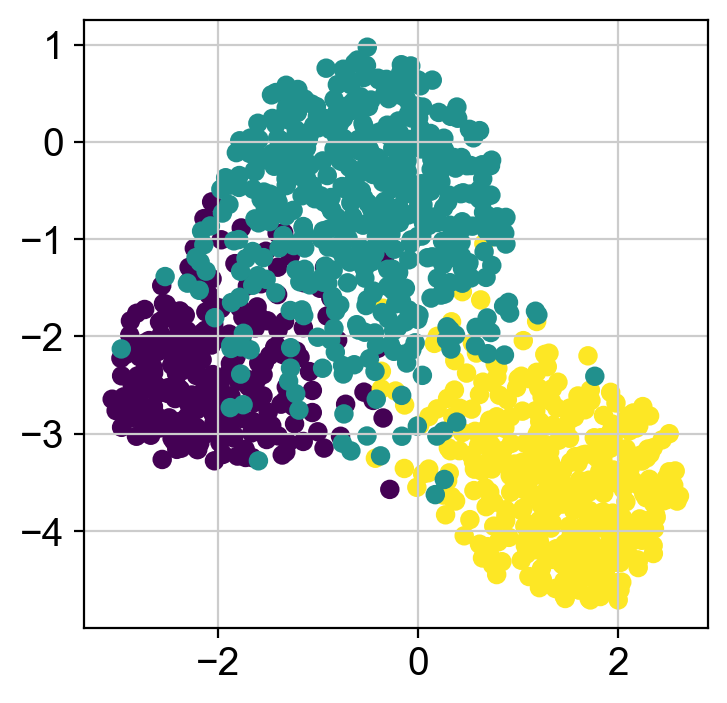

None


In [84]:
plot_UMAP_hiddenLayer_embedding(data['training data'],
                                data['labels'],
                                'layer_1',
                                model_chosen,
                                "lower right")
                                

35/35 [==============================] - 0s 4ms/step


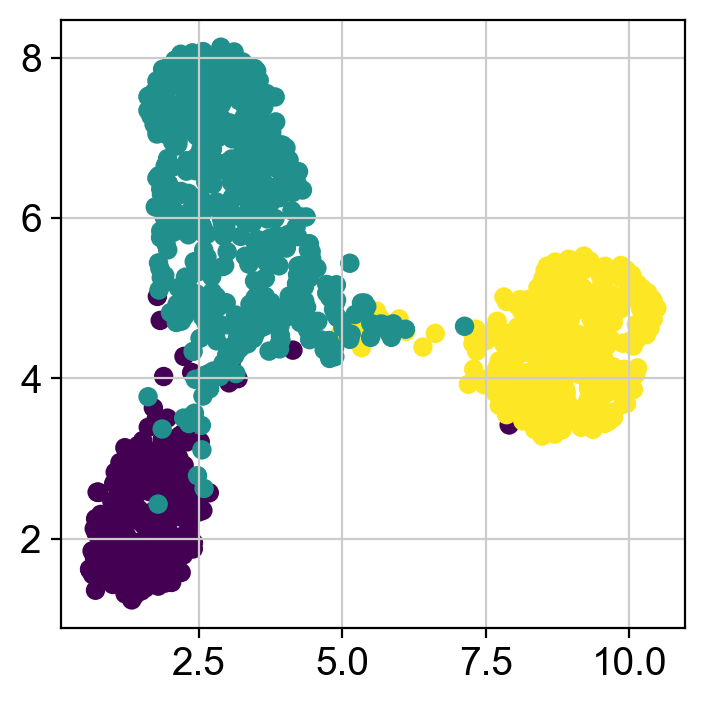

None


In [85]:
plot_UMAP_hiddenLayer_embedding(data['training data'],
                                data['labels'],
                                'layer_2',
                                model_chosen,
                                "none")

35/35 [==============================] - 0s 4ms/step


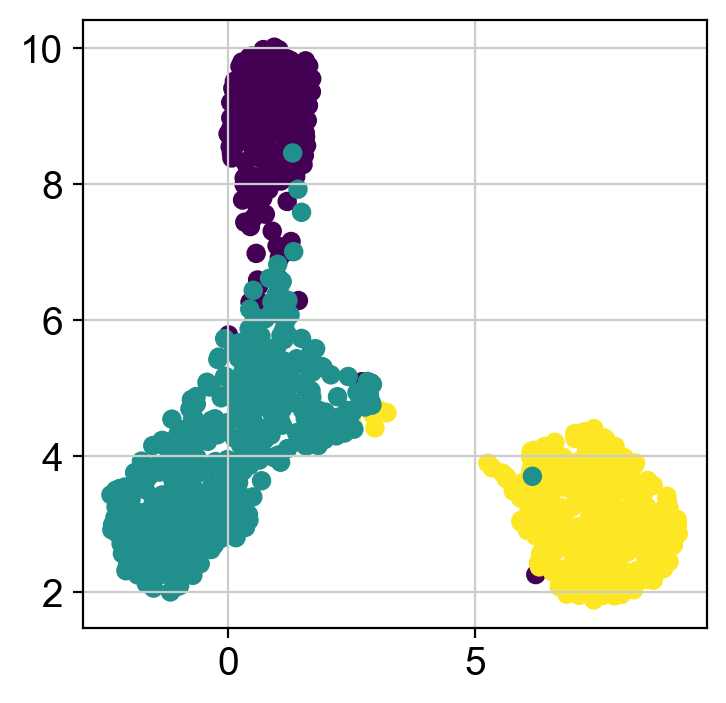

None


In [86]:
plot_UMAP_hiddenLayer_embedding(data['training data'],
                                data['labels'],
                                'layer_3',
                                model_chosen,
                                "none")

4/4 [==============================] - 0s 5ms/step


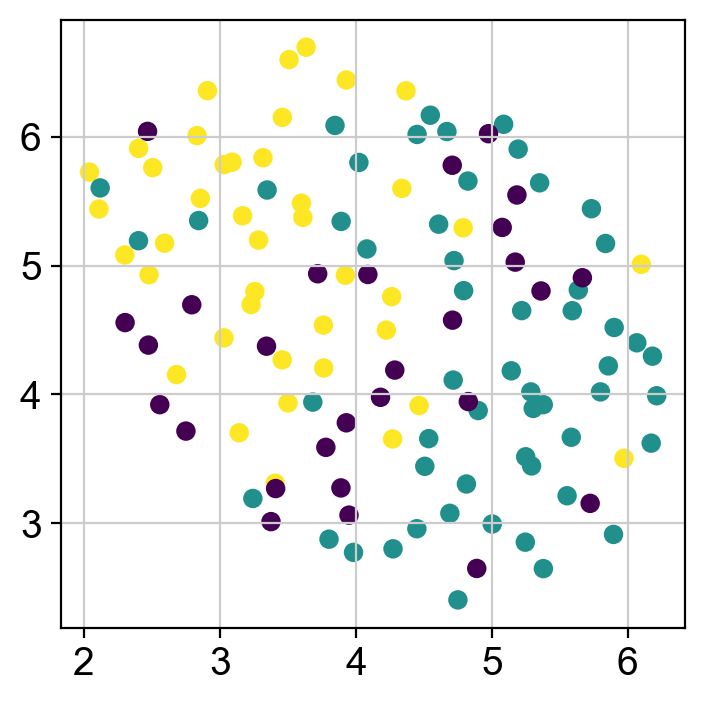

None


In [87]:
plot_UMAP_hiddenLayer_embedding(test_data['testing data'],
                                test_data['labels'],
                                'layer_1',
                                model_chosen,
                                "none")

4/4 [==============================] - 0s 5ms/step


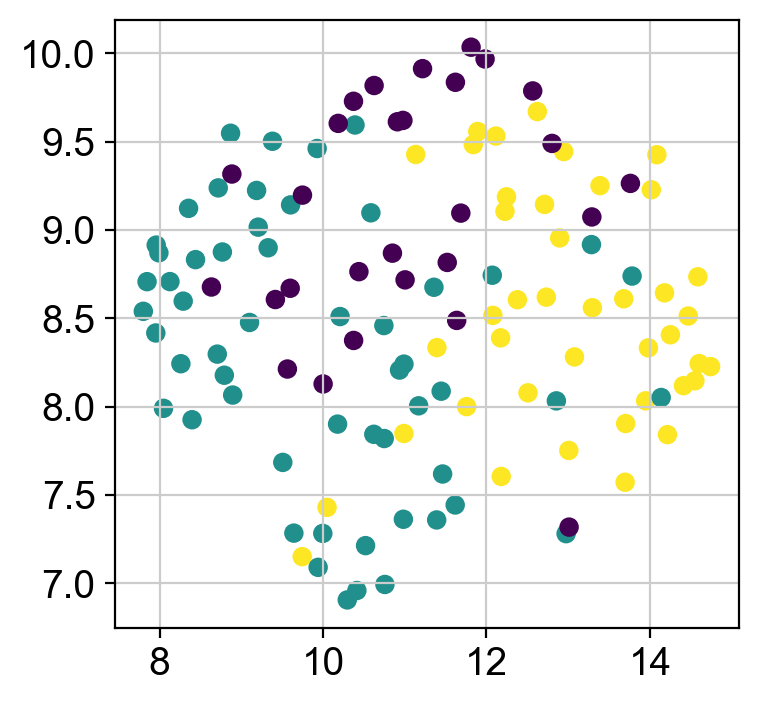

None


In [88]:
plot_UMAP_hiddenLayer_embedding(test_data['testing data'],
                                test_data['labels'],
                                'layer_2',
                                model_chosen,
                                "none")

4/4 [==============================] - 0s 4ms/step


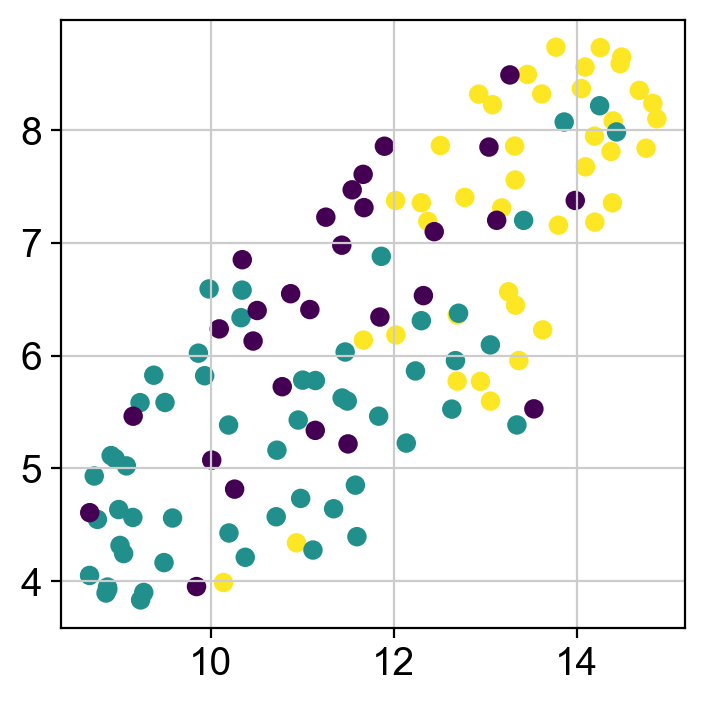

None


In [89]:
plot_UMAP_hiddenLayer_embedding(test_data['testing data'],
                                test_data['labels'],
                                'layer_3',
                                model_chosen,
                                "none")

In [90]:
#extract shapley importance feature from keras model
#run per label to extract importance per label 

In [91]:
#Trying to get feature importance using the training data, to see what the model learnt
input_data = data['training data']
explainer = shap.DeepExplainer(model_chosen, input_data)
shap_values = explainer.shap_values(input_data)

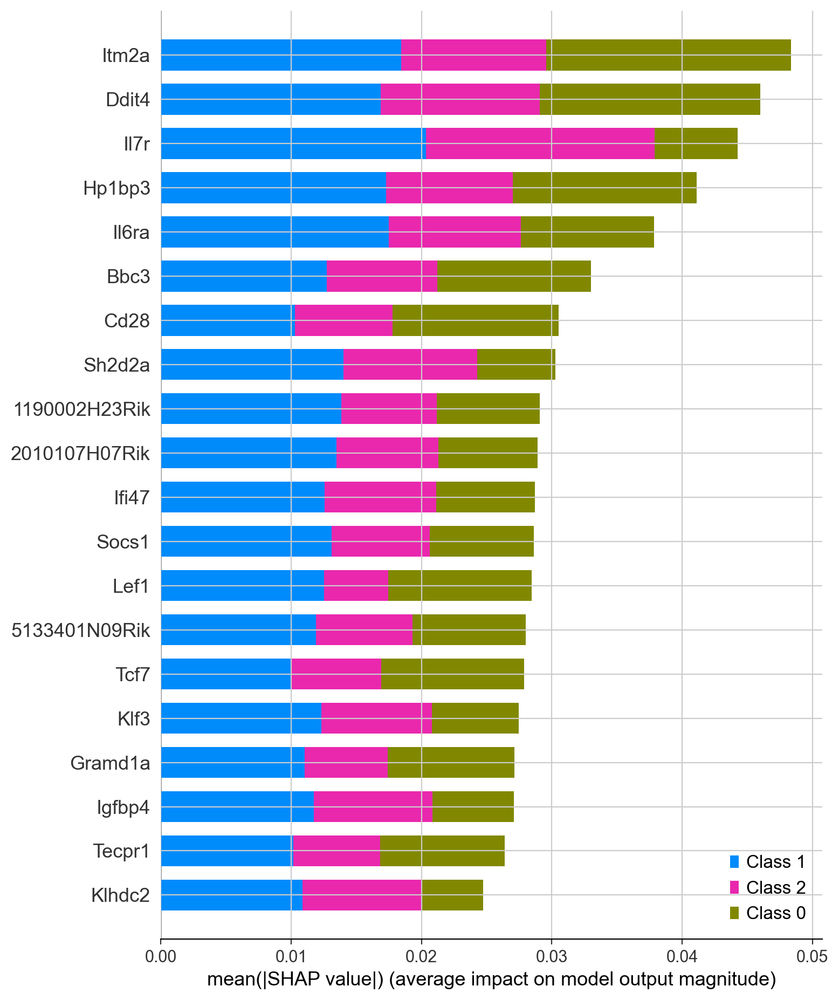

In [92]:
shap.summary_plot(shap_values, input_data, feature_names=df_nvCD4_train_dnn.columns.tolist())

#fig = plt.gcf()
#fig.bar(cmap = 'viridis_r')
#for idx, patch in enumerate(fig.patches):
    #if idx == 1:
        #patch.set_facecolor('lightblue')  # Set even-indexed bars to light blue
    #else:
        #patch.set_facecolor('lightcoral')  # Set odd-indexed bars to light coral


#plt.show()

In [93]:
shap_values[0]

array([[-3.83973331e-03,  2.16410626e-07,  3.34150449e-04, ...,
        -1.71895983e-04, -1.12083551e-04, -2.88877163e-06],
       [-6.18743303e-04,  9.94186507e-07,  4.63128788e-04, ...,
        -1.56380789e-04, -1.62655808e-04, -6.18398076e-07],
       [-1.31683294e-02,  9.31282193e-06, -4.86406637e-03, ...,
         3.54111777e-04, -2.88831652e-04,  1.20551349e-05],
       ...,
       [ 1.79188361e-03,  3.56607075e-06,  4.78037022e-04, ...,
        -6.46495842e-04, -1.50815351e-04,  3.53204291e-06],
       [ 6.10783172e-04,  7.64837807e-07,  2.56677711e-04, ...,
        -4.94933978e-04, -5.01080249e-05,  1.51814936e-06],
       [ 7.88487087e-04,  2.36223599e-07,  3.90319561e-04, ...,
        -8.89920280e-04, -6.46802364e-05,  7.79366133e-07]])

In [94]:
top_features_count = 100
gene_labels = df_nvCD4_train_dnn.columns.tolist()
shap_genes_all_classes = pd.DataFrame()
for class_index in [0,1,2]:  # Assuming shap_values.shape[1] is the number of classes
    class_shap_values = shap_values[class_index]
    top_features_indices = np.argsort(-np.abs(class_shap_values.mean(0)))[:top_features_count]
    
    print(f"\nTop features for Class {class_index}:")
    shap_genes = []
    for feature_index in top_features_indices:
        print(f"Gene {gene_labels[feature_index]}: {class_shap_values.mean(0)[feature_index]}")
        shap_genes.append(gene_labels[feature_index])
    shap_genes_all_classes[class_index]=shap_genes


Top features for Class 0:
Gene Bbc3: -8.03291706168758e-10
Gene Stk10: -7.946450101111882e-10
Gene Ddit4: -7.820518581931018e-10
Gene Itm2a: -6.336417105298356e-10
Gene 1190002H23Rik: 5.591013112799764e-10
Gene Leo1: 5.480501386045944e-10
Gene Socs3: 5.250297720392284e-10
Gene Zbtb7b: -4.918352455466188e-10
Gene Il7r: 4.599136056120707e-10
Gene Clint1: -4.541301937674039e-10
Gene 2010107H07Rik: -3.709016839690906e-10
Gene 2610019F03Rik: 3.7036152557488677e-10
Gene Pdlim1: -3.688942992344632e-10
Gene Klhdc1: 3.645013180175738e-10
Gene 2410004N09Rik: 3.624676051369339e-10
Gene Zfp53: -3.50170077061713e-10
Gene Tarbp2: -3.445864292318999e-10
Gene Hdac2: -3.3473952498752625e-10
Gene Zfp775: -3.2775468688279425e-10
Gene Itk: -3.1519838168086216e-10
Gene Cand2: -3.145172757155836e-10
Gene Hspbap1: 3.050063566791193e-10
Gene Slc37a1: 3.0411310295416374e-10
Gene Arl16: 3.0190575119247245e-10
Gene Il27ra: 3.007410701424565e-10
Gene Zmym3: -2.9474490150148214e-10
Gene 2810001G20Rik: -2.90346844

In [95]:
shap_genes_all_classes

,0,1,2
0,Bbc3,Bbc3,5133401N09Rik
1,Stk10,Hp1bp3,Slc37a1
2,Ddit4,4932438A13Rik,Socs3
3,Itm2a,Ddit4,Lef1
4,1190002H23Rik,Il7r,Ece2
...,...,...,...
95,Cd27,Tbc1d2b,Mfhas1
96,Aven,Zfp958,Smad5
97,Gm14446,Tmub1,Skap1
98,Nt5c3l,Zfp53,Acpp


In [96]:
set0 = set(shap_genes_all_classes.iloc[:,0])
set0

{'1190002H23Rik',
 '1810020D17Rik',
 '2010107H07Rik',
 '2310061J03Rik',
 '2410004N09Rik',
 '2610019F03Rik',
 '2810001G20Rik',
 '2810454H06Rik',
 'Abhd8',
 'Acss2',
 'Actr6',
 'Adk',
 'Alkbh4',
 'Arl16',
 'Asxl1',
 'Atp11b',
 'Atp1b1',
 'Atp8b4',
 'Aven',
 'Axin2',
 'Bbc3',
 'Cand2',
 'Cd27',
 'Cd3eap',
 'Cdk5rap1',
 'Cflar',
 'Clint1',
 'Daxx',
 'Ddb2',
 'Ddit4',
 'Def6',
 'Dolk',
 'Ecm1',
 'Epm2aip1',
 'Fam105a',
 'Fam123b',
 'Fbxo31',
 'Fdxr',
 'Frmd8',
 'Galnt10',
 'Gbp8',
 'Ggt5',
 'Gm12250',
 'Gm14085',
 'Gm14446',
 'Gm15417',
 'Gpr180',
 'Hdac2',
 'Hp1bp3',
 'Hspbap1',
 'Ibtk',
 'Igf2r',
 'Il27ra',
 'Il7r',
 'Impdh1',
 'Ipcef1',
 'Irf7',
 'Itk',
 'Itm2a',
 'Izumo4',
 'Klhdc1',
 'Leo1',
 'Lfng',
 'Meis3',
 'Mfng',
 'Mxi1',
 'Mylpf',
 'Ncbp1',
 'Nnt',
 'Nt5c3l',
 'Nudt6',
 'Nupl1',
 'Pcgf5',
 'Pdlim1',
 'Phpt1',
 'Pygm',
 'Rundc3a',
 'Sept9',
 'Sh2d2a',
 'Sigirr',
 'Slc37a1',
 'Socs3',
 'Ssbp4',
 'Stard3',
 'Stat5b',
 'Stk10',
 'Tarbp2',
 'Tbc1d22b',
 'Tgtp1',
 'Thumpd1',
 'Trpm7',

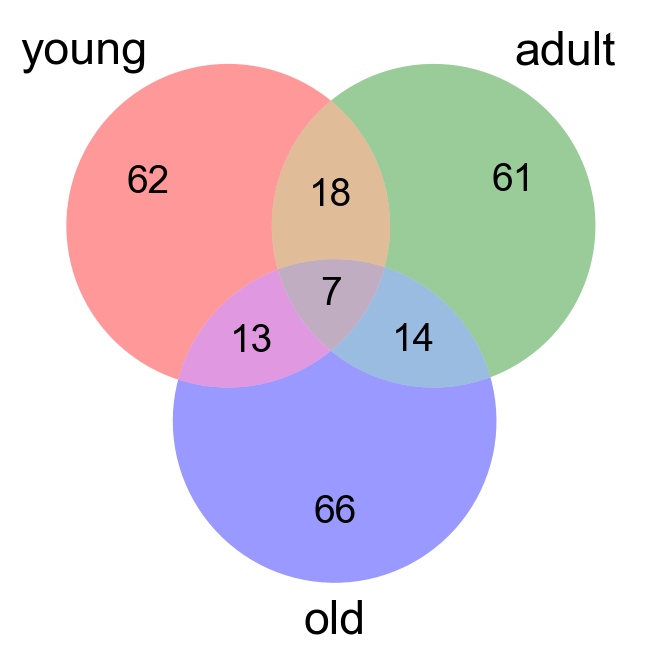

In [97]:
from matplotlib_venn import venn3

set0 = set(shap_genes_all_classes.iloc[:,0])
set1 = set(shap_genes_all_classes.iloc[:,1])
set2 = set(shap_genes_all_classes.iloc[:,2])
venn3([set0, set1, set2], set_labels = ("young", "adult", "old"))

plt.show()

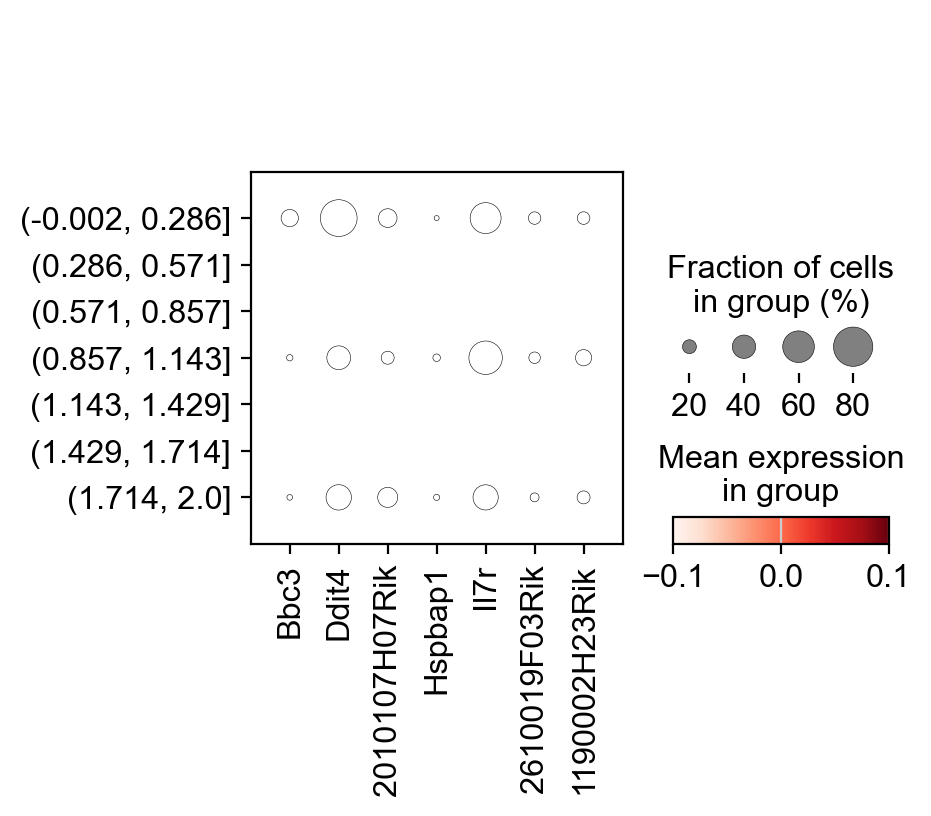

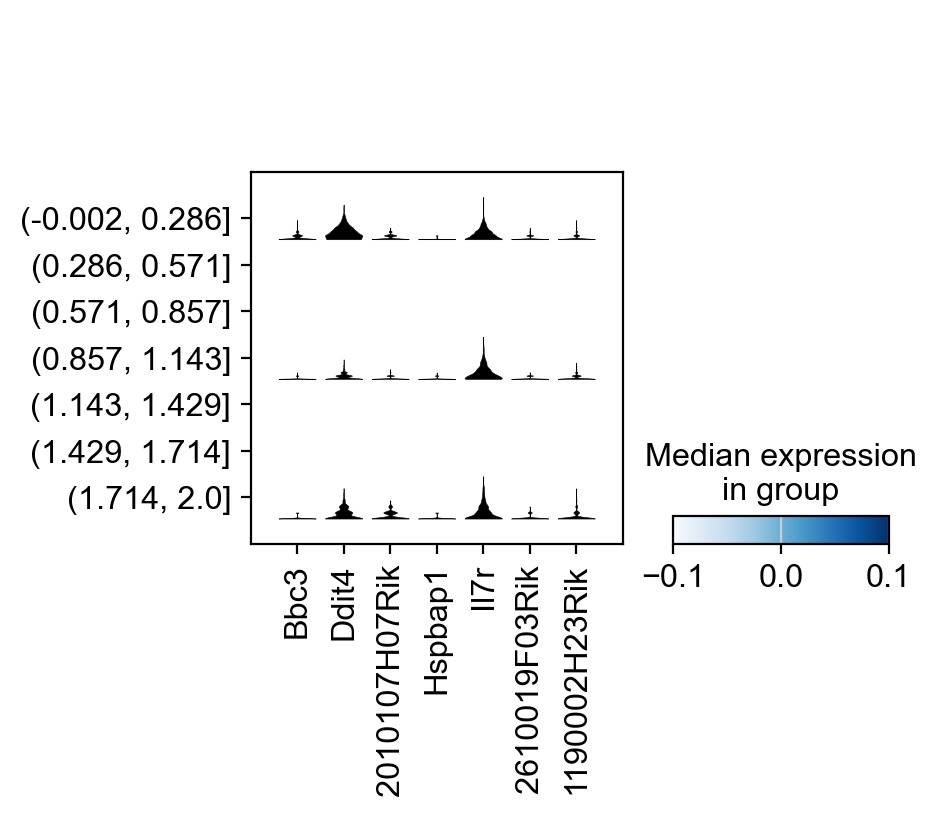

In [98]:
common_genes = list(set0 & set1 & set2)
common_genes
sc.pl.dotplot(naive_CD4_adata, common_genes, groupby='age_dnn_label') 
sc.pl.stacked_violin(naive_CD4_adata, common_genes, groupby='age_dnn_label', rotation=90) #stacked violin plots to visualize marker genes in each cluster

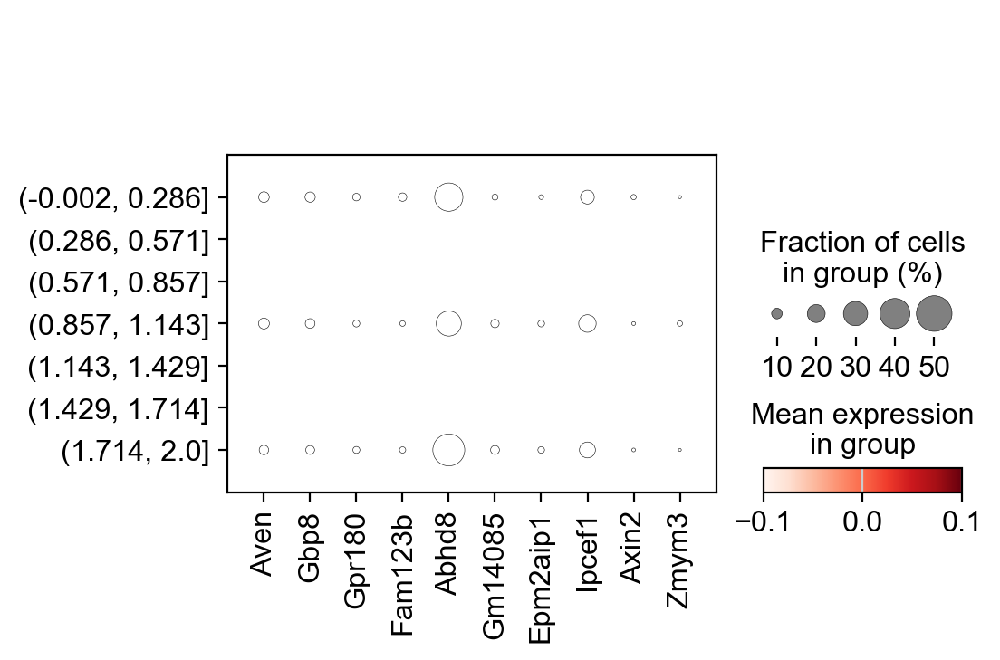

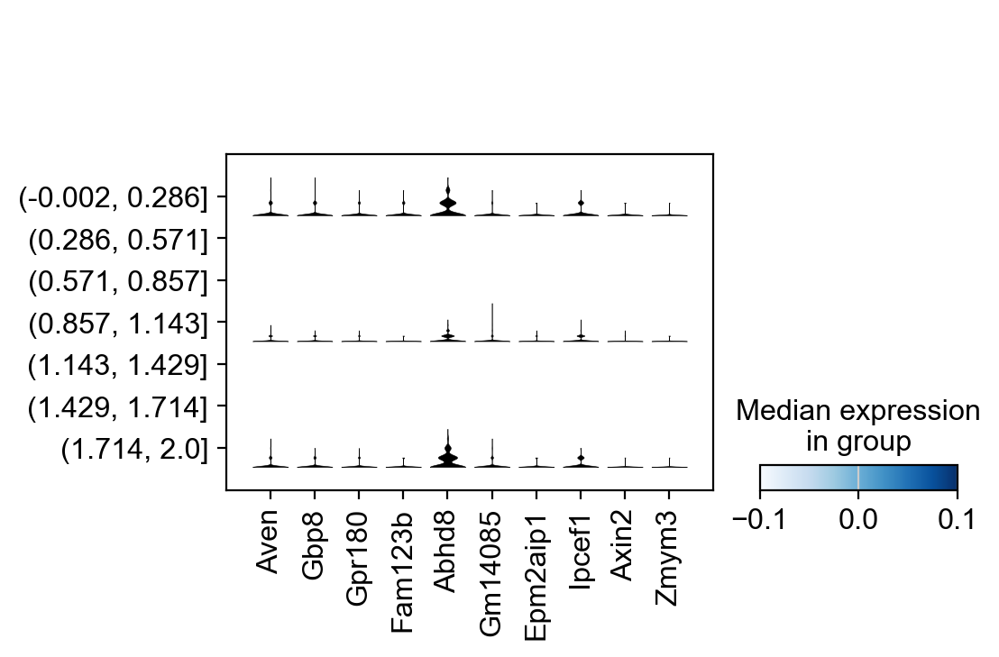

In [99]:
unique_genes_young = list(set0 - set1 - set2)[0:10]
sc.pl.dotplot(naive_CD4_adata, unique_genes_young, groupby='age_dnn_label') 
sc.pl.stacked_violin(naive_CD4_adata, unique_genes_young, groupby='age_dnn_label', rotation=90)

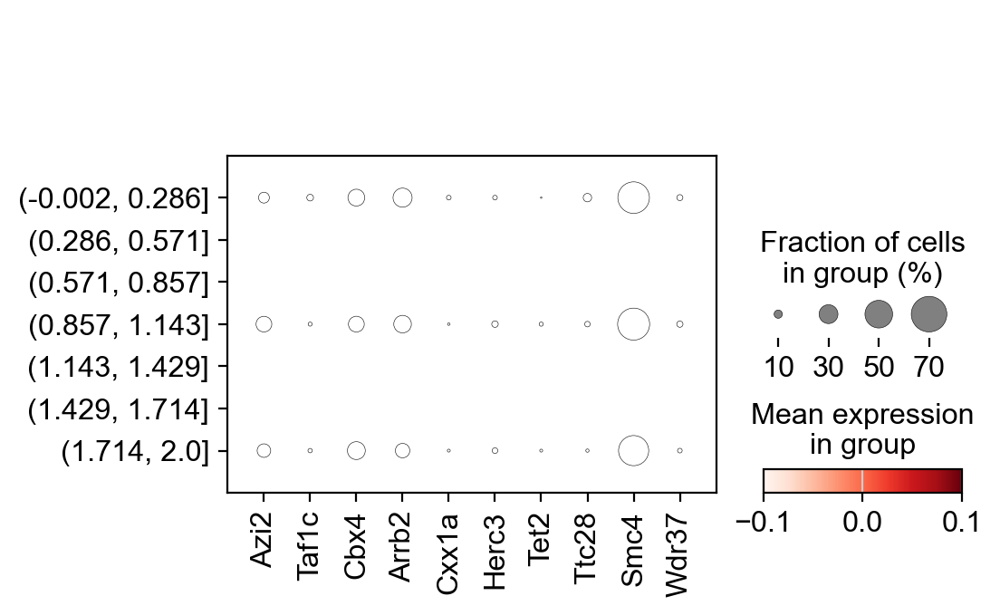

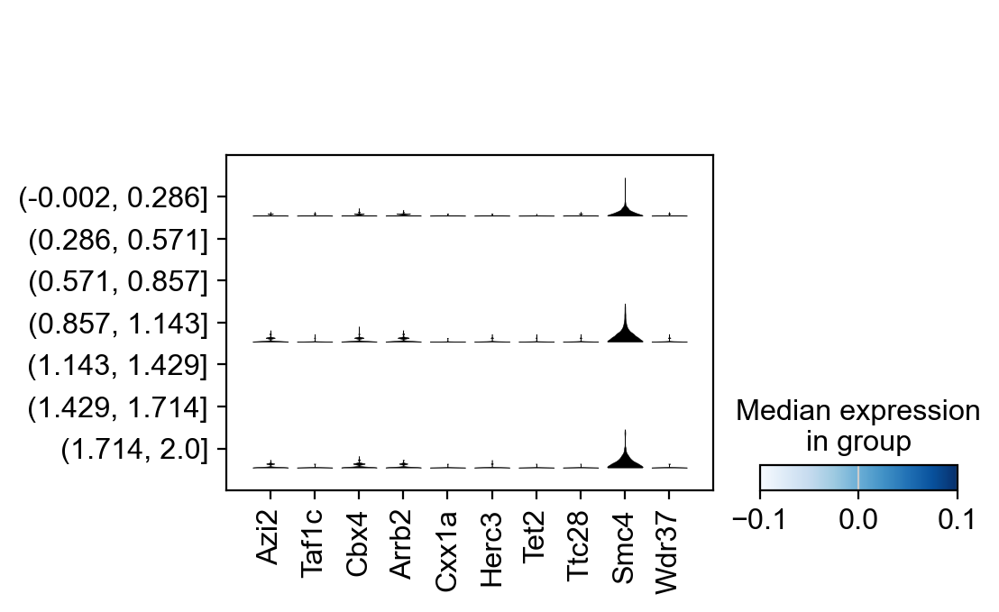

In [100]:
unique_genes_adult = list(set1 - set0 - set2)[0:10]
sc.pl.dotplot(naive_CD4_adata, unique_genes_adult, groupby='age_dnn_label') 
sc.pl.stacked_violin(naive_CD4_adata, unique_genes_adult, groupby='age_dnn_label', rotation=90)

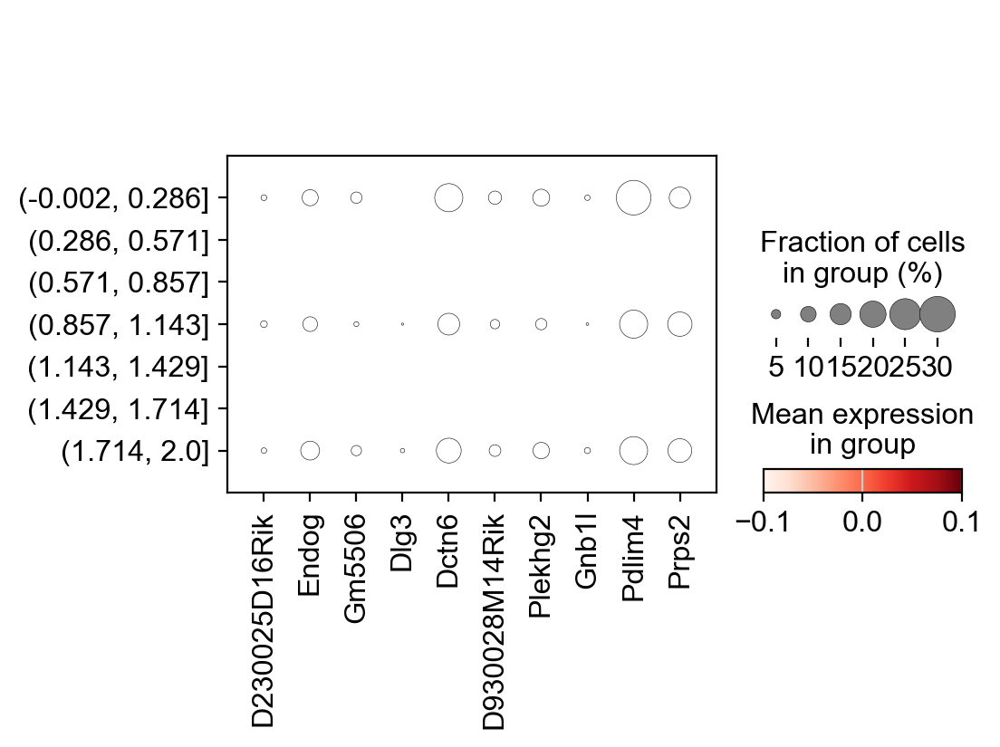

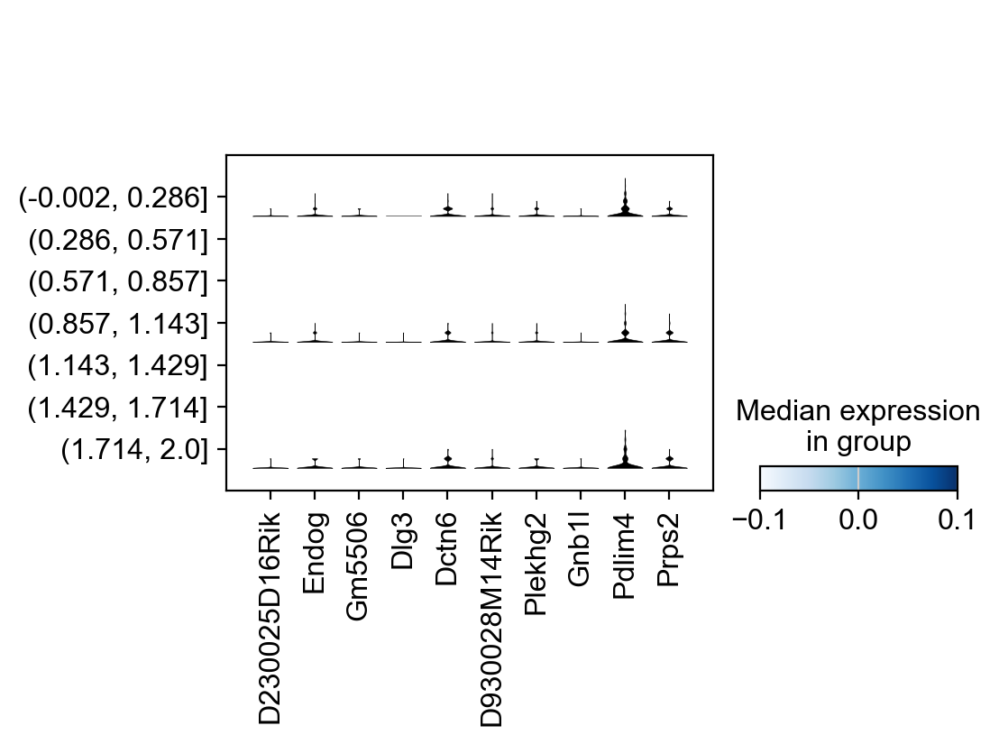

In [101]:
unique_genes_old = list(set2 - set0 - set1)[0:10]
sc.pl.dotplot(naive_CD4_adata, unique_genes_old, groupby='age_dnn_label') 
sc.pl.stacked_violin(naive_CD4_adata, unique_genes_old, groupby='age_dnn_label', rotation=90)

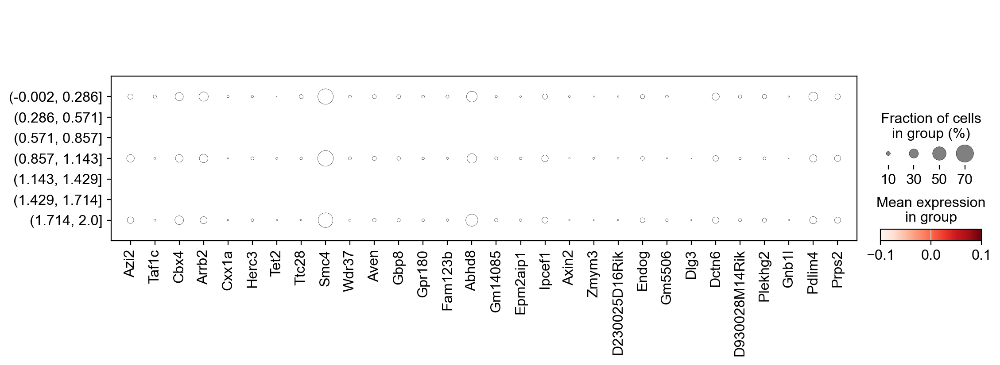

In [102]:
sc.pl.dotplot(naive_CD4_adata, 
              unique_genes_adult+unique_genes_young+unique_genes_old,
               groupby='age_dnn_label') 

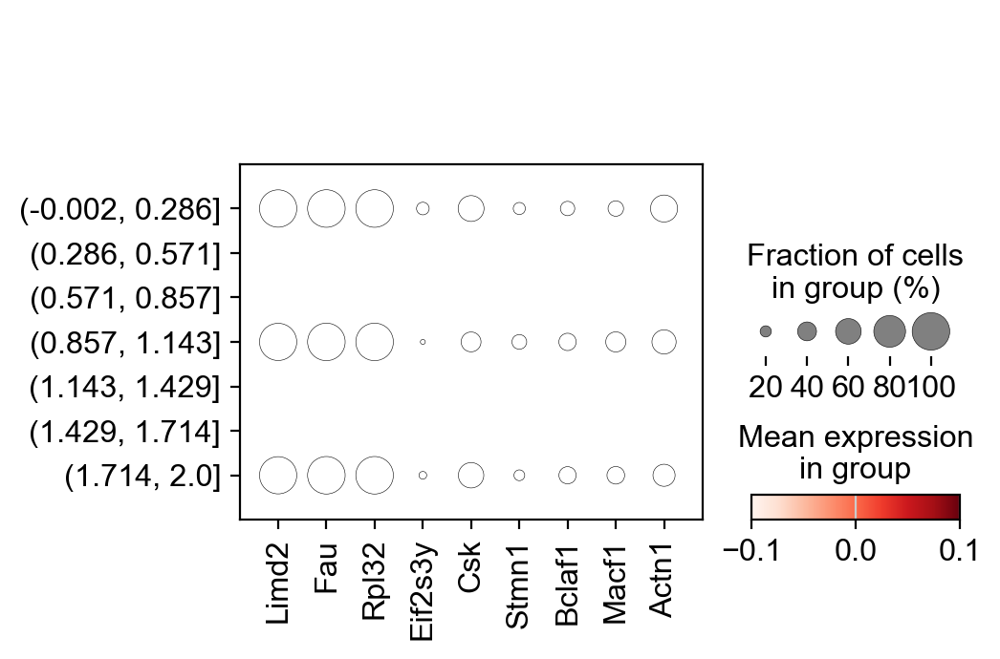

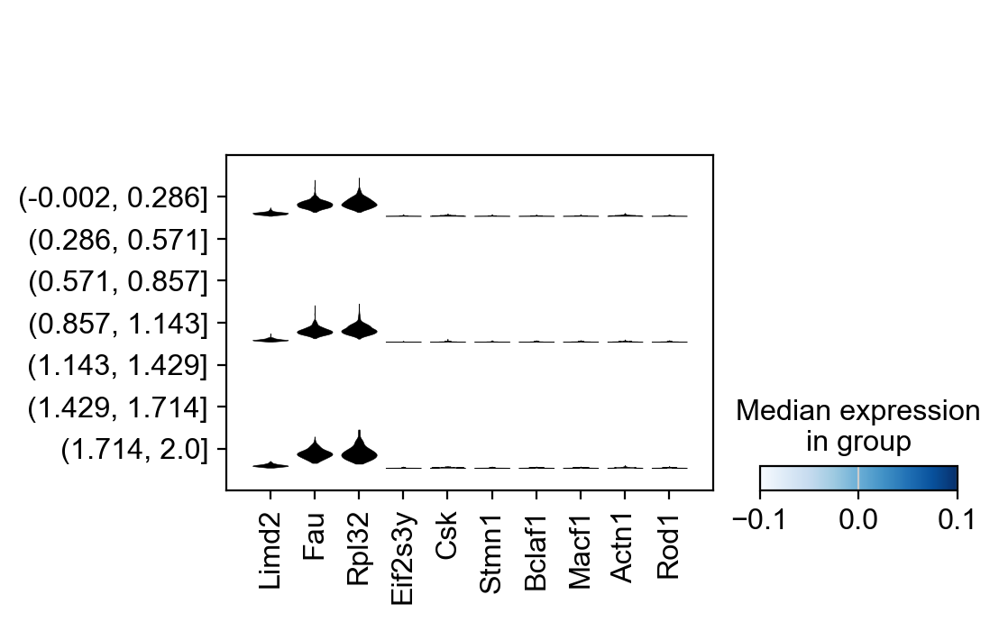

In [103]:
sc.pl.dotplot(naive_CD4_adata, list(all_wilcoxon_genes)[0:9], groupby='age_dnn_label') 
sc.pl.stacked_violin(naive_CD4_adata, list(all_wilcoxon_genes)[0:10], groupby='age_dnn_label', rotation=90)

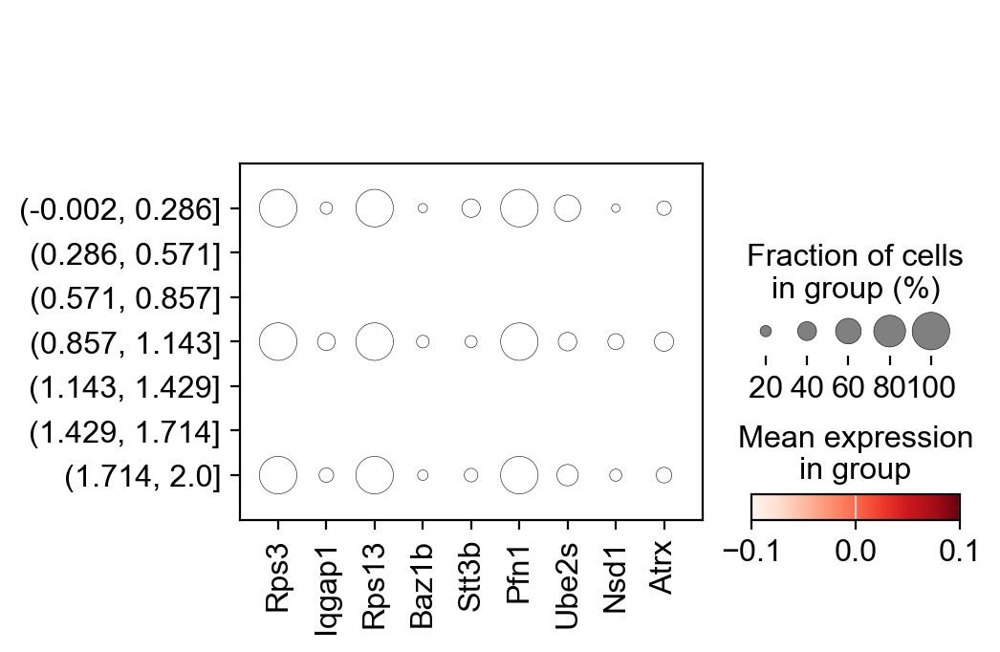

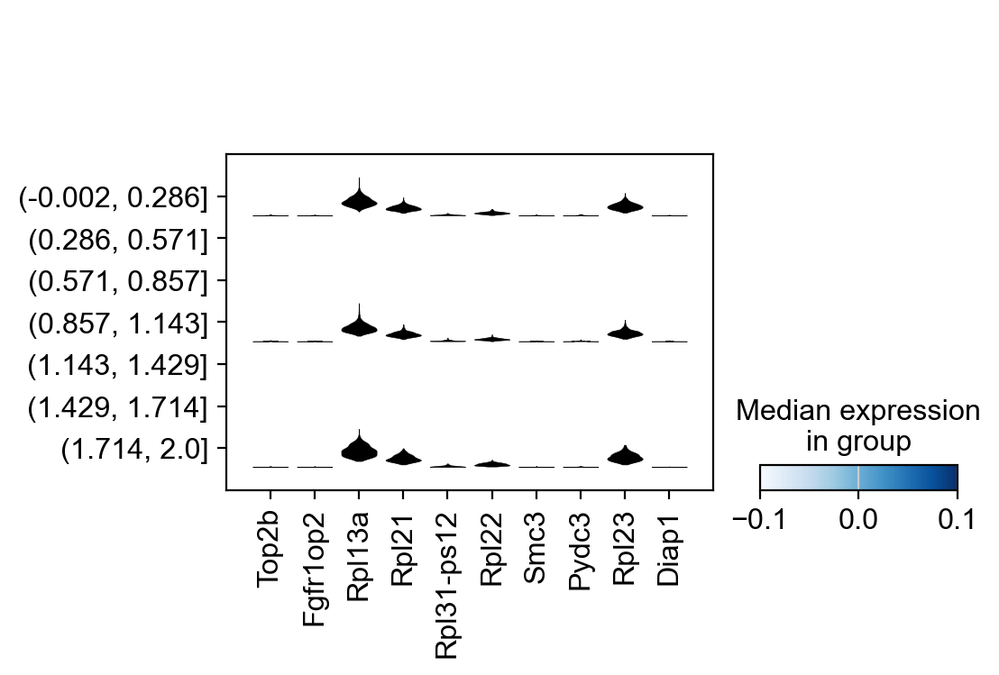

In [104]:
sc.pl.dotplot(naive_CD4_adata, list(all_wilcoxon_genes)[100:109], groupby='age_dnn_label') 
sc.pl.stacked_violin(naive_CD4_adata, list(all_wilcoxon_genes)[33:43], groupby='age_dnn_label', rotation=90)

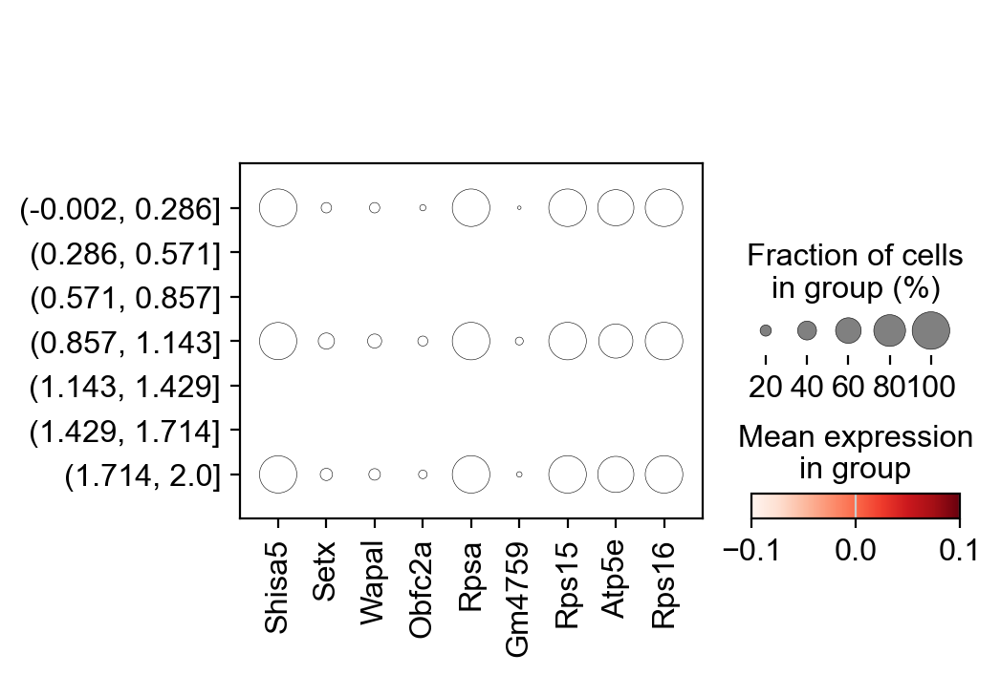

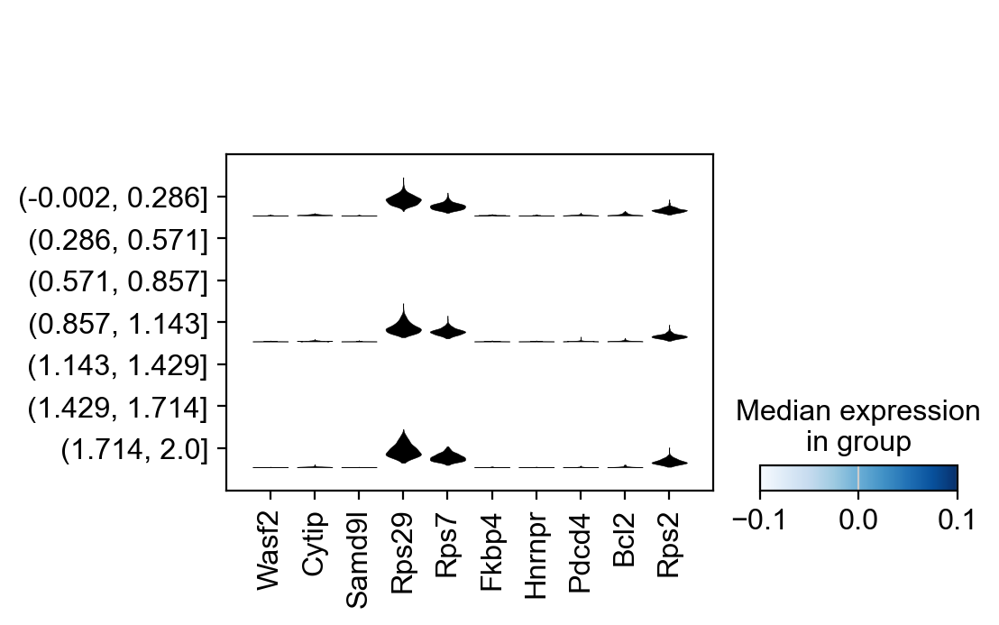

In [105]:
sc.pl.dotplot(naive_CD4_adata, list(all_wilcoxon_genes)[200:209], groupby='age_dnn_label') 
sc.pl.stacked_violin(naive_CD4_adata, list(all_wilcoxon_genes)[66:76], groupby='age_dnn_label', rotation=90)

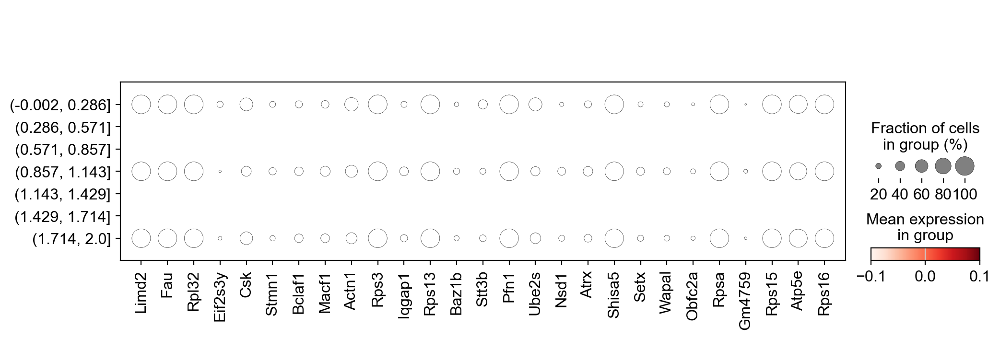

In [106]:
sc.pl.dotplot(naive_CD4_adata, 
              list(all_wilcoxon_genes)[0:9]+list(all_wilcoxon_genes)[100:109]+list(all_wilcoxon_genes)[200:209], 
              groupby='age_dnn_label') 

In [107]:
all_shap_genes = set0 | set1 | set2

In [108]:
common_wilc_shap = list(all_shap_genes & all_wilcoxon_genes)
common_wilc_shap

['Bbc3',
 'Ddit4',
 'Azi2',
 'A130040M12Rik',
 'Frmd8',
 'Setx',
 'Itm2a',
 'Hp1bp3',
 'Gramd1a',
 'Igfbp4',
 'Gm4759',
 'Il7r',
 'Socs3',
 'Pydc3',
 'Skap1',
 'Lef1',
 '1190002H23Rik']

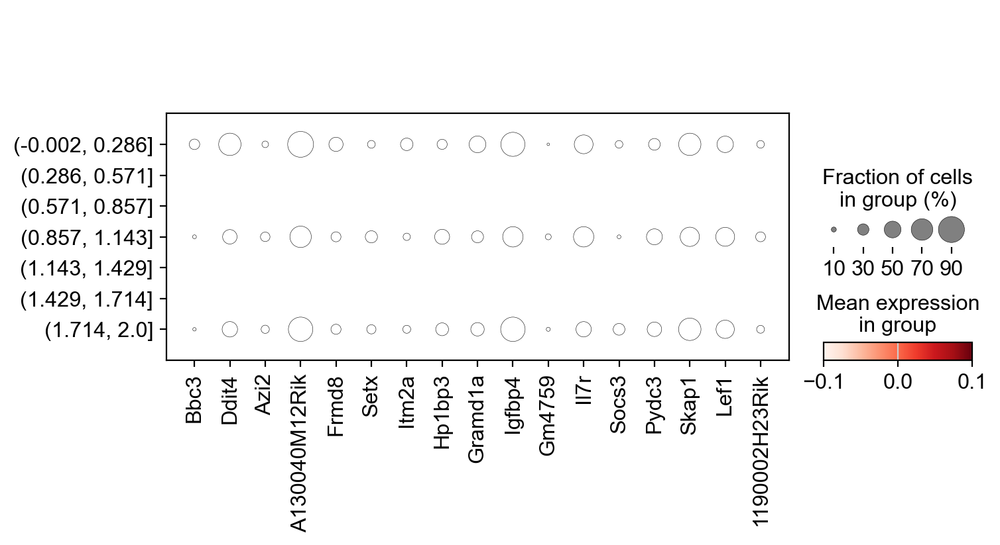

In [109]:
sc.pl.dotplot(naive_CD4_adata, common_wilc_shap, groupby='age_dnn_label') 

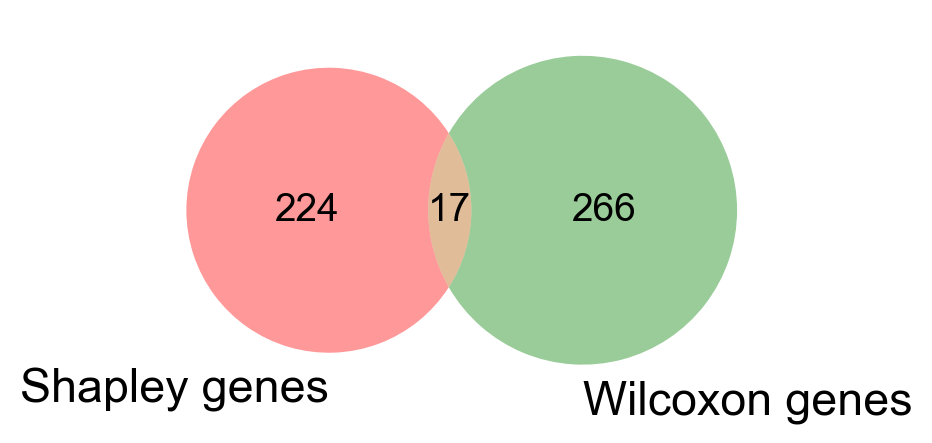

In [110]:
from matplotlib_venn import venn2
venn2([all_shap_genes, all_wilcoxon_genes], set_labels = ('Shapley genes', 'Wilcoxon genes'))
plt.show()